<div style="padding:20px; 
            color:#f5f5f5;
            margin:10px;
            font-size:220%;
            text-align:center;
            display:fill;
            border-radius:20px;
            border-width: 5px;
            border-style: solid;
            border-color:#03212e;
            background-color:#143847;
            font-family:newtimeroman;
            overflow:hidden;
            font-weight:500">CUSTOMER SEGMENTATION</div>

<center>
<img src="https://github.com/DorobantuDiana/DS_Projects/blob/main/objects/customer_segmentation.gif?raw=true" width=600>
</center>

---
<br>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:160%;text-align:center;border-radius:10px 10px;">TABLE OF CONTENTS</p>   
    
1. [Dataset](#1)
    
2. [Scope & Methods ](#2)
    
3. [Libraries](#3)
   
4. [Data Loading](#4)
    
5. [Data Cleaning](#5)
    
6. [Feature Engineering](#6)  
    
7. [Descriptive Statistics](#7)
    
8. [PCA](#8)
    
9. [K-Means Clustering](#9)
    
10. [Hierarchical Clustering](#10)
    
11. [Summary](#11)
    
<br>
    
---

<a id="1"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Dataset</p>

<b>People</b>


* ID: Customer's unique identifier

* Year_Birth: Customer's birth year

* Education: Customer's education level

* Marital_Status: Customer's marital status

* Income: Customer's yearly household income

* Kidhome: Number of children in customer's household

* Teenhome: Number of teenagers in customer's household

* Dt_Customer: Date of customer's enrollment with the company

* Recency: Number of days since customer's last purchase

* Complain: 1 if the customer complained in the last 2 years, 0 otherwise


<b>Products</b>


* MntWines: Amount spent on wine in last 2 years

* MntFruits: Amount spent on fruits in last 2 years

* MntMeatProducts: Amount spent on meat in last 2 years

* MntFishProducts: Amount spent on fish in last 2 years

* MntSweetProducts: Amount spent on sweets in last 2 years

* MntGoldProds: Amount spent on gold in last 2 years


<b>Promotion</b>


* NumDealsPurchases: Number of purchases made with a discount

* AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise

* AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise

* AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise

* AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise

* AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise

* Response: 1 if customer accepted the offer in the last campaign, 0 otherwise


<b>Place</b>


* NumWebPurchases: Number of purchases made through the company’s website

* NumCatalogPurchases: Number of purchases made using a catalogue

* NumStorePurchases: Number of purchases made directly in stores

* NumWebVisitsMonth: Number of visits to company’s website in the last month

<br>

More information about the dataset you can find [here](http://www.kaggle.com/datasets/imakash3011/customer-personality-analysis).

<a id="2"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Scope & Methods</p>

The <b>objective</b> of this project is to conduct <u>customer segmentation</u> using <u>clustering analysis</u> to provide a concise summary of customer groups in order for companies to focus their marketing efforts accordingly.

<i><b>Customer Segmentation</b></i> is one of the most important applications of unsupervised learning. Using clustering techniques, companies can categorize the customer base into different groups based on various relevant factors for marketing purposes

<i><b>Clustering</b></i> is one of the important data mining methods for discovering knowledge in multidimensional data. The goal of clustering is to identify pattern or groups of similar objects within a data set of interest. In the literature, it is referred as pattern recognition or unsupervised machine learning.

The standard process of clustering can be divided into the following several steps : 

* <b>Feature extraction and selection</b> -> extract and select the most representative features from the original data set
* <b>Clustering algorithm design</b> -> design the clustering algorithm according to the characteristics of the problem 
* <b>Result evaluation</b> -> evaluate the clustering result and judge the validity of algorithm 
* <b>Result explanation</b> -> give a practical explanation for the clustering result

When choosing a clustering algorithm, you should consider <u><b>whether the algorithm scales to your dataset</b></u>.

Many clustering algorithms work by computing the similarity between all pairs of examples (this means their runtime increases as the square of the number of examples n, denoted as O(n2) in complexity notation).

For this project are going to use PCA, K-Means and Hierarchical Clustering algorithms.

<a id="3"></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Libraries</p>  

In [1]:
pacman :: p_load(pacman, stats, dplyr, ggplot2, ggExtra, GGally,corrplot, RColorBrewer, psych,graphics,lattice,caret,
                 tidyr, fpc, data.table, DT, gridExtra,purrr, plotly, caret,cluster,RPMG, dendextend, dbscan)
                 

options(warn=-1) # warnings will be suppressed and will not be displayed in the console or any output


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


ggExtra installed

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


RPMG installed



<a id="4"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Data Loading</p>

In [2]:
# Read data
data <- read.table("/kaggle/input/customer-personality-analysis/marketing_campaign.csv", sep = "\t", header = T)

# Nr. of instances
cat("Number of instances:", nrow(data))

# View data
head(data, 10)



Number of instances: 2240

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,⋯,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,5524,1957,Graduation,Single,58138,0,0,04-09-2012,58,635,⋯,7,0,0,0,0,0,0,3,11,1
2,2174,1954,Graduation,Single,46344,1,1,08-03-2014,38,11,⋯,5,0,0,0,0,0,0,3,11,0
3,4141,1965,Graduation,Together,71613,0,0,21-08-2013,26,426,⋯,4,0,0,0,0,0,0,3,11,0
4,6182,1984,Graduation,Together,26646,1,0,10-02-2014,26,11,⋯,6,0,0,0,0,0,0,3,11,0
5,5324,1981,PhD,Married,58293,1,0,19-01-2014,94,173,⋯,5,0,0,0,0,0,0,3,11,0
6,7446,1967,Master,Together,62513,0,1,09-09-2013,16,520,⋯,6,0,0,0,0,0,0,3,11,0
7,965,1971,Graduation,Divorced,55635,0,1,13-11-2012,34,235,⋯,6,0,0,0,0,0,0,3,11,0
8,6177,1985,PhD,Married,33454,1,0,08-05-2013,32,76,⋯,8,0,0,0,0,0,0,3,11,0
9,4855,1974,PhD,Together,30351,1,0,06-06-2013,19,14,⋯,9,0,0,0,0,0,0,3,11,1


<a id="5"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Data Cleaning</p>

In [3]:
# Inspect data
check <- function(data) {
  l <- list()
  columns <- names(data)
  for (col in columns) {
    instances <- sum(!is.na(data[[col]]))
    dtypes <- class(data[[col]])
    unique <- length(unique(data[[col]]))
    sum_null <- sum(is.na(data[[col]]))
    duplicates <- sum(duplicated(data))
    l[[length(l) + 1]] <- c(col, dtypes, instances, unique, sum_null, duplicates)
  }
  data_check <- as.data.frame(do.call(rbind, l))
  names(data_check) <- c("column", "dtype", "instances", "unique", "sum_null", "duplicates")
  return(data_check)
}

check(data)

column,dtype,instances,unique,sum_null,duplicates
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ID,integer,2240,2240,0,0
Year_Birth,integer,2240,59,0,0
Education,character,2240,5,0,0
Marital_Status,character,2240,8,0,0
Income,integer,2216,1975,24,0
Kidhome,integer,2240,3,0,0
Teenhome,integer,2240,3,0,0
Dt_Customer,character,2240,663,0,0
Recency,integer,2240,100,0,0


<div class="alert alert-block alert-success"> 
    
  * There are <u>24 missing values</u> in <b><i>Income</i></b> column 
 
  * There are <u>no duplicates</u>

  => In order to preserve the original distribution of the data, we're going to <u>drop the rows with missing values</u> from <b><i>Income</i></b> column.   
</div>


In [4]:
# Remove the NA Values
data <- na.omit(data)
cat("The total number of instances after removing the rows with missing values is:", nrow(data))

The total number of instances after removing the rows with missing values is: 2216

<a id="6"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Feature Engineering</p>


<div class="alert alert-block alert-success">  
    <u>New features:</u>
    
* <i><b>Tenure</b></i> -> indicates the number of days between the date the customer's recording began and the last recorded date  
    
* <i><b>Age</b></i> -> indicates the age of the customer 
    
* <i><b>Spendings</b></i> -> indicates the total amount spent by the customer in various categories over the span of two years
    
* <i><b>RelationshipStatus</b></i> -> indicates wether the customer is or is not in a relationship
    
* <i><b>RelStatus</b></i> -> indicates a numeric segmentation of <i>RelationshopStatus</i> feature
    
* <i><b>Children</b></i> -> indicates the total amount of children in a household
    
* <i><b>Parent</b></i> -> indicates the parenthood status
    
* <i><b>Education</b></i> -> indicates a simpler segmentation of education levels in three groups
    
* <i><b>LevEd</b></i> -> indicates a numeric segmentation of <i>Education</i> feature

* <i><b>Campaign</b></i> -> indicates the number of campaings the customer accepted
    
* <i><b>Purchases</b></i> -> indicates the total amount of purchases in last 2 years
</div>

In [5]:
# Tenure
data$Dt_Customer <- as.Date(data$Dt_Customer, format= "%d-%m-%Y")
days <- as.numeric(max(data$Dt_Customer) - data$Dt_Customer)
data$Tenure <- days
data$Tenure <- as.numeric(data$Tenure, errors="coerce")

# Age
data$Age <- 2023 - data$Year_Birth

# Spendings
data$Spendings <- data$MntWines + data$MntFruits + data$MntMeatProducts + data$MntFishProducts + data$MntSweetProducts + data$MntGoldProds

    # Wines
    data$Wines <- data$MntWines

    # Fruits
    data$Fruits <- data$MntFruits

    # Meat
    data$Meat <- data$MntMeatProducts

    # Fish
    data$Fish <- data$MntFishProducts

    # Sweets
    data$Sweets <- data$MntSweetProducts

    # Gold
    data$Gold <- data$MntGoldProds

# Relatioship Status
data$RelationshipStatus <- ifelse(data$Marital_Status == "Married" | data$Marital_Status == "Together", "Partner",
ifelse(data$Marital_Status %in% c("Absurd", "Widow", "YOLO", "Divorced", "Single"), "Alone", ""))

data$RelStatus <- ifelse(data$RelationshipStatus == "Partner", 2, 1)


# Children
data$Children <- data$Kidhome + data$Teenhome

# Parent
data$Parent <- ifelse(data$Children > 0, 1, 0)

# Education 
data$Education <- ifelse(data$Education %in% c("Basic", "2n Cycle"), "Undergraduate",
                         ifelse(data$Education == "Graduation", "Graduate",
                                ifelse(data$Education %in% c("Master", "PhD"), "Postgraduate", "")))

data$LevEd <- as.numeric(ifelse(data$Education == "Undergraduate",1,
                             ifelse(data$Education == "Graduate", 2,
                                ifelse(data$Education == "Postgraduate", 3, 0))))
                                       
# Campaign
data$Campaign <- data$AcceptedCmp1 + data$AcceptedCmp2 + data$AcceptedCmp3 + data$AcceptedCmp4 + data$AcceptedCmp5

# Purchases
data$Purchases <- data$NumDealsPurchases + data$NumWebPurchases + data$NumCatalogPurchases + data$NumStorePurchases



In [6]:
# Change names of different variables for simplicity
data$WebVisits <- data$NumWebVisitsMonth
data$Web <- data$NumWebPurchases
data$Deal<- data$NumDealsPurchases
data$Catalog <- data$NumCatalogPurchases
data$Store <- data$NumStorePurchases

<div class="alert alert-block alert-success">  
    We're going to drop some of the redundant features and set <b>ds</b> as our cleaned data set for further analysis.  
</div>

In [7]:
to_drop <- c("Marital_Status", "NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth", "Dt_Customer","MntWines","MntFruits","MntMeatProducts","MntFishProducts","MntSweetProducts","MntGoldProds","AcceptedCmp1","AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5","Z_CostContact", "Z_Revenue", "Year_Birth", "ID","Teenhome","Kidhome")
ds <- data[, !(names(data) %in% to_drop)]
# check(ds)

<a id="7"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Descriptive Statistics</p>

In [8]:
# Generating a summary of all data attributes
describe(ds)
# summary(ds)
do.call(cbind, lapply(ds, summary))

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Education*,1,2216,1.611011e+00,6.834686e-01,1.0,1.514092e+00,0.0000,1,3,2,0.672627247,-0.6830960,1.451890e-02
Income,2,2216,5.224725e+04,2.517308e+04,51381.5,5.176399e+04,24548.1495,1730,666666,664936,6.754333782,159.1276059,5.347508e+02
Recency,3,2216,4.901264e+01,2.894835e+01,49.0,4.899267e+01,37.0650,0,99,99,0.001645477,-1.2014022,6.149488e-01
Complain,4,2216,9.476534e-03,9.690700e-02,0.0,0.000000e+00,0.0000,0,1,1,10.119023205,100.4399561,2.058592e-03
Response,5,2216,1.502708e-01,3.574173e-01,0.0,6.313416e-02,0.0000,0,1,1,1.956096983,1.8271405,7.592602e-03
Tenure,6,2216,3.535212e+02,2.024347e+02,355.5,3.538811e+02,258.7137,0,699,699,-0.016899257,-1.2014275,4.300312e+00
Age,7,2216,5.417960e+01,1.198555e+01,53.0,5.404510e+01,13.3434,27,130,103,0.353182830,0.7269415,2.546087e-01
Spendings,8,2216,6.070754e+02,6.029005e+02,396.5,5.276150e+02,524.0991,5,2525,2520,0.856893520,-0.3508523,1.280739e+01
Wines,9,2216,3.050916e+02,3.373279e+02,174.5,2.502751e+02,245.3703,0,1493,1493,1.169135662,0.5754916,7.165845e+00


,Education,Income,Recency,Complain,Response,Tenure,Age,Spendings,Wines,Fruits,⋯,Children,Parent,LevEd,Campaign,Purchases,WebVisits,Web,Deal,Catalog,Store
Min.,2216,1730,0,0,0,0,27,5,0,0,⋯,0,0,1,0,0,0,0,0,0,0
1st Qu.,character,35303,24,0,0,180,46,69,24,2,⋯,0,0,2,0,8,3,2,1,0,3
Median,character,51381.5,49,0,0,355.5,53,396.5,174.5,8,⋯,1,1,2,0,15,6,4,2,2,5
Mean,2216,52247.2513537906,49.0126353790614,0.00947653429602888,0.150270758122744,353.521209386282,54.1796028880866,607.07536101083,305.091606498195,26.3560469314079,⋯,0.947202166064982,0.714350180505415,2.26714801444043,0.298285198555957,14.8808664259928,5.31904332129964,4.08528880866426,2.3235559566787,2.67102888086643,5.80099277978339
3rd Qu.,character,68522,74,0,0,529,64,1048,505,33,⋯,1,1,3,0,21,7,6,3,4,8
Max.,character,666666,99,1,1,699,130,2525,1493,199,⋯,3,1,3,4,44,20,27,15,28,13


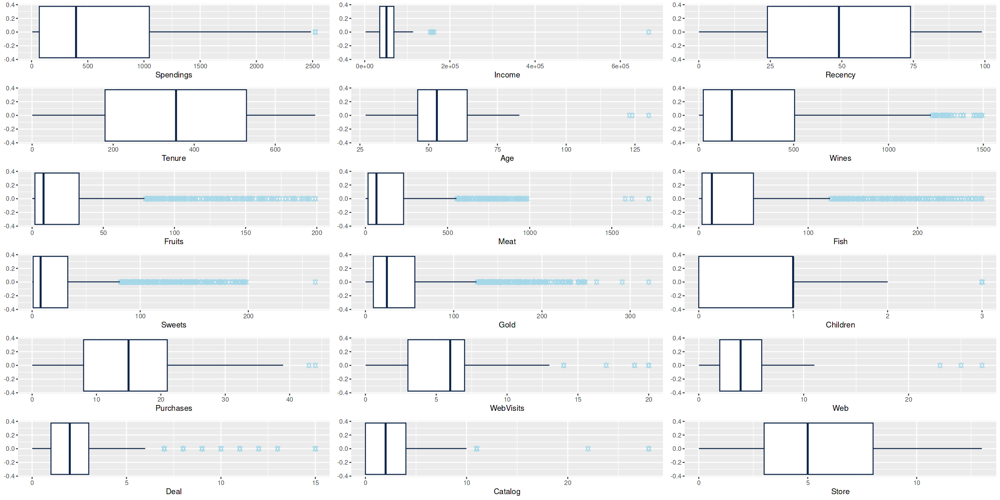

In [9]:
options(repr.plot.width=20, repr.plot.height=10)
plots <- list()
variables <- c("Spendings", "Income", "Recency", "Tenure", "Age", "Wines", "Fruits", "Meat", "Fish", "Sweets", "Gold", "Children", "Purchases", "WebVisits", "Web", "Deal", "Catalog", "Store")

for (var in variables) {
  plot <- ggplot(ds, aes_string(x = var, fill = var)) +
    geom_boxplot(outlier.colour = "#A5D7E8", outlier.shape = 11, outlier.size = 2, col = "#0B2447", notch = F)
  plots[[var]] <- plot
}

grid.arrange(grobs = plots, ncol = 3)


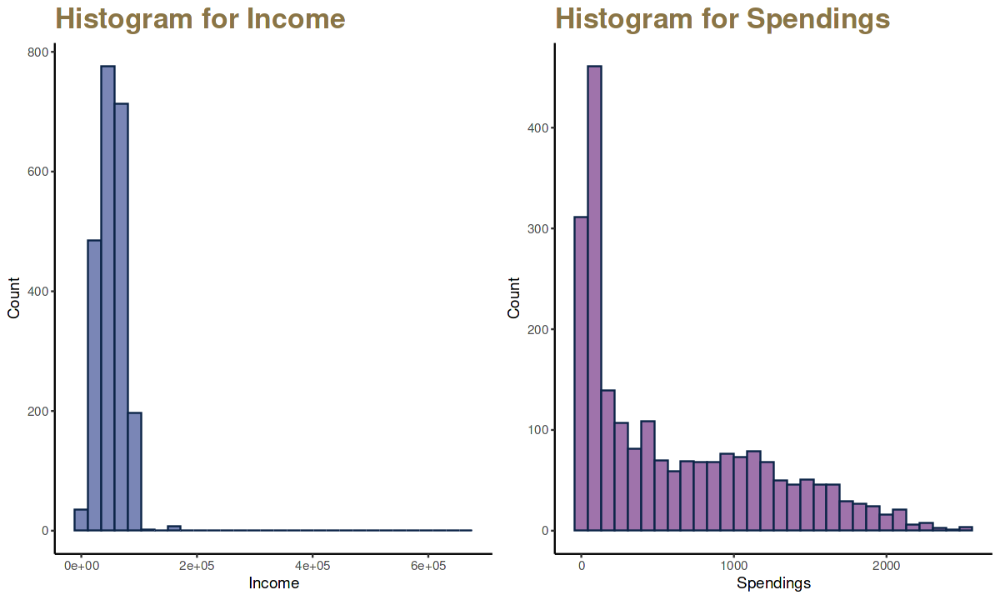

In [10]:
options(repr.plot.width=10, repr.plot.height=6) 
require(gridExtra)

Income_hist <- ggplot(ds, aes(x = Income)) +
  geom_histogram(color = '#0B2447', fill ='#7A86B6', bins=30) +
  labs(
    title = "Histogram for Income",
#     caption = "Source: Gapminder dataset",
    x = "Income",
    y = "Count"
  ) +
  theme_classic() +
  theme(
    plot.title = element_text(color = "#8A7546", size = 20, face = "bold"),
    plot.subtitle = element_text(color = "#D6B978",size = 12, face = "bold"),
    plot.caption = element_text(face = "italic"))

Spendings_hist <- ggplot(ds, aes(x = Spendings)) +
  geom_histogram(color = '#0B2447', fill ='#9F73AB', bins=30) +
  labs(
    title = "Histogram for Spendings",
#     caption = "Source: Gapminder dataset",
    x = "Spendings",
    y = "Count"
  ) +
  theme_classic() +
  theme(
    plot.title = element_text(color = "#8A7546", size = 20, face = "bold"),
    plot.subtitle = element_text(color = "#D6B978",size = 12, face = "bold"),
    plot.caption = element_text(face = "italic"))

grid.arrange(Income_hist, Spendings_hist, ncol=2)

In [11]:
describe(ds$Income)
summary(ds$Income)

IQR_Income <- 68522 - 35303
upfen_Income <- 68522 + 1.5*IQR_Income
cat("\n","The upper fence for Income column would be:",upfen_Income)


describe(ds$Spendings)
summary(ds$Spendings)

IQR_Spendings <- 1048 - 69
upfen_Spendings <- 1048 + 1.5*IQR_Spendings
cat("\n","The upper fence for Spendings column would be:",upfen_Spendings)
 

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,2216,52247.25,25173.08,51381.5,51763.99,24548.15,1730,666666,664936,6.754334,159.1276,534.7508


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1730   35303   51382   52247   68522  666666 


 The upper fence for Income column would be: 118350.5

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,2216,607.0754,602.9005,396.5,527.615,524.0991,5,2525,2520,0.8568935,-0.3508523,12.80739


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    5.0    69.0   396.5   607.1  1048.0  2525.0 


 The upper fence for Spendings column would be: 2516.5

In [12]:
ds <- subset(ds, Income <= 118350.5 & Spendings <= 2516.5)
# check(ds)
cat("The total number of instances after removing the rows with outliers in Income & Spendings columns is:", nrow(ds), "\n")

The total number of instances after removing the rows with outliers in Income & Spendings columns is: 2205 


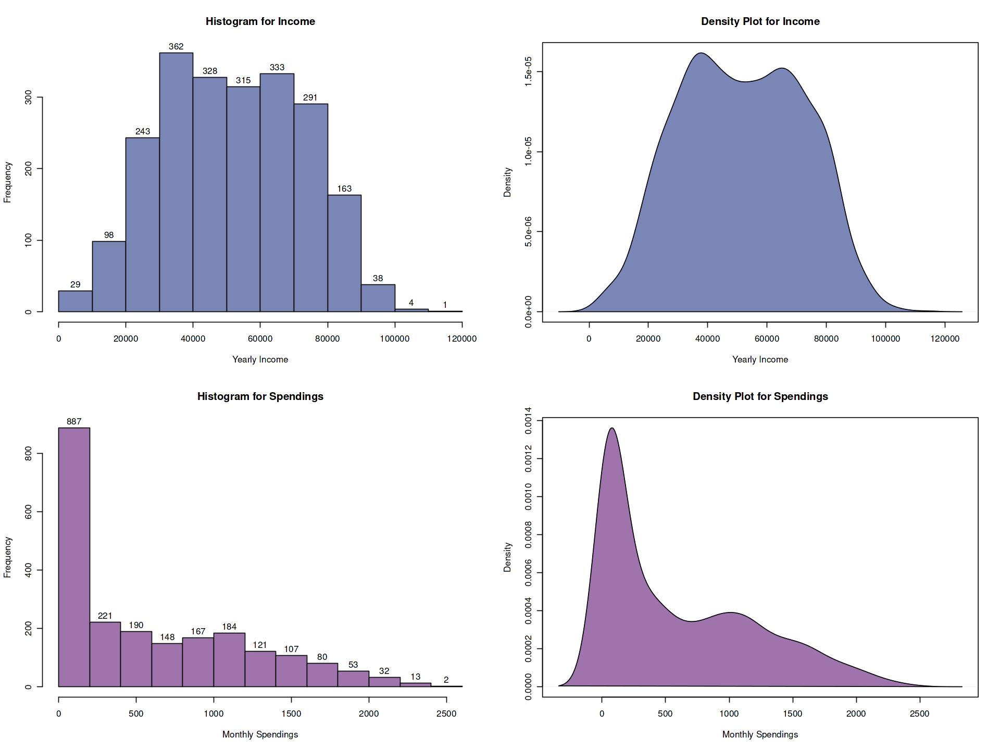

In [13]:
options(repr.plot.width=16, repr.plot.height=12) 
par(mfrow = c(2, 2))

Income_hist <- hist(ds$Income,
  col="#7A86B6",
  main="Histogram for Income",
  xlab="Yearly Income",
  ylab="Frequency",
  labels=TRUE)

 Income_density <- plot(density(ds$Income),
    col="#7A86B6",
    main="Density Plot for Income",
    xlab="Yearly Income",
    ylab="Density")
polygon(density(ds$Income),
        col="#7A86B6")

Spendings_hist <- hist(ds$Spendings,
  col="#9F73AB",
  main="Histogram for Spendings",
  xlab="Monthly Spendings",
  ylab="Frequency",
  labels=TRUE)

 Spendings_density <- plot(density(ds$Spendings),
    col="#9F73AB",
    main="Density Plot for Spendings",
    xlab="Monthly Spendings",
    ylab="Density")
polygon(density(ds$Spendings),
        col="#9F73AB")


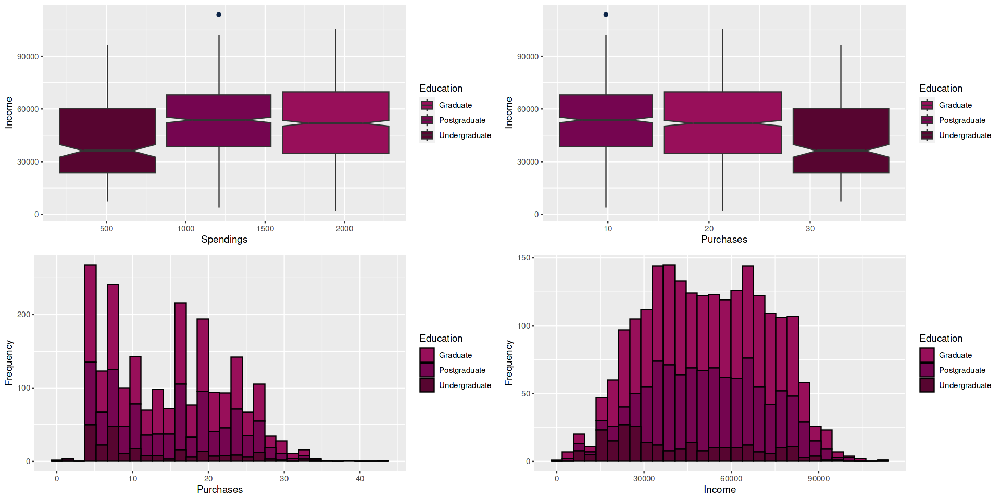

In [14]:
options(repr.plot.width=16, repr.plot.height=8) 
require(gridExtra)

income_spendings_education_plot <- ggplot(ds, aes(x=Spendings,y=Income,fill=Education)) +
geom_boxplot(outlier.colour="#0B2447", outlier.shape=16,outlier.size=2, notch=T) + 
scale_fill_manual(values = c("#980F5A", "#750550", "#570530")) +
scale_color_manual(values = c( "#0B2447"))

income_purchases_education_plot <- ggplot(ds, aes(x=Purchases,y=Income,fill=Education)) +
geom_boxplot(outlier.colour="#0B2447", outlier.shape=16,outlier.size=2, notch=T) + 
scale_fill_manual(values = c("#980F5A", "#750550", "#570530")) +
scale_color_manual(values = c( "#0B2447"))

purchases_hist <- ggplot(ds, aes(x=Purchases, fill=Education)) + 
  geom_histogram(color="black", bins = 30) +
  labs(x="Purchases", y="Frequency") +
  scale_fill_manual(values = c("#980F5A", "#750550", "#570530"))

income_hist <- ggplot(ds, aes(x=Income, fill=Education)) + 
  geom_histogram(color="black", bins = 30) +
  labs(x="Income", y="Frequency") +
  scale_fill_manual(values = c("#980F5A", "#750550", "#570530"))

grid.arrange(income_spendings_education_plot, income_purchases_education_plot, purchases_hist, income_hist, ncol=2, nrow=2)

<div class="alert alert-block alert-success">  
    There are multiple categorical variables which we're going to drop in order to create a new dataframe <b>ds_num</b> to work (when needed) with functions that require dataframes containing just numerical values.   
</div>

In [15]:
# Drop categorial variables 
drop <- c("Education", "RelationshipStatus")
ds_num <- ds[,!(names(ds) %in% drop)]
# check(num)

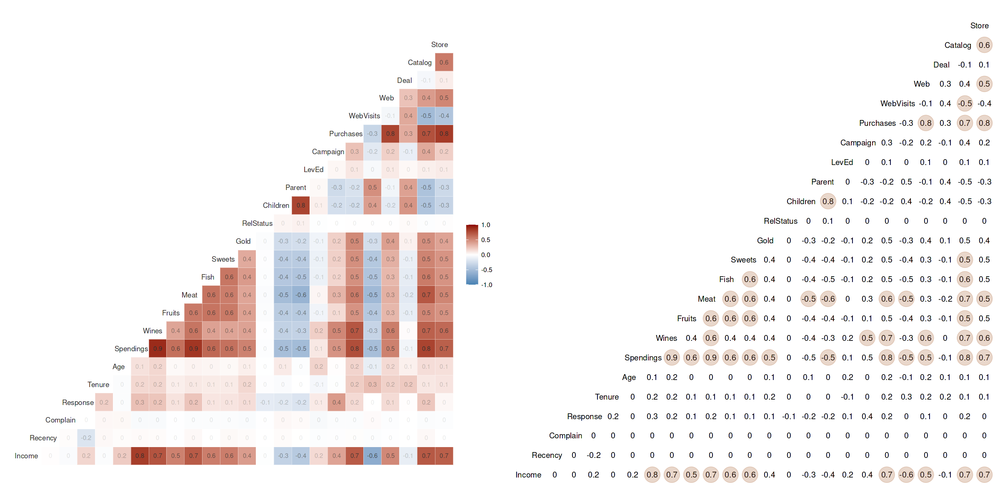

In [16]:
# Check correlation between all variables
options(repr.plot.width=20, repr.plot.height=10)
require(gridExtra)

plot1 <- ggcorr(ds, method = c("pairwise", "pearson"),hjust = 0.75, size = 3.5, color = "#302e2e", layout.exp = 1, geom = "tile", low = "steelblue", mid = "white", high = "darkred", label = TRUE, label_size = 3, label_color = "#302e2e", label_alpha = TRUE)
# compare with other methods: c("complete", "pearson"),c("complete", "kendall"), c("all.obs", "spearman")
plot2 <- ggcorr(ds, method = c("pairwise", "pearson"),hjust = 0.75, label = TRUE, hjust = 0.75, geom = "blank", layout.exp = 1) + geom_point(size = 10, aes(color = coefficient > 0, alpha = abs(coefficient) > 0.5), color = "#a86232") +
  scale_alpha_manual(values = c("TRUE" = 0.25, "FALSE" = 0)) +
  guides(color = FALSE, alpha = FALSE)
grid.arrange(plot1, plot2, ncol=2, nrow=1)

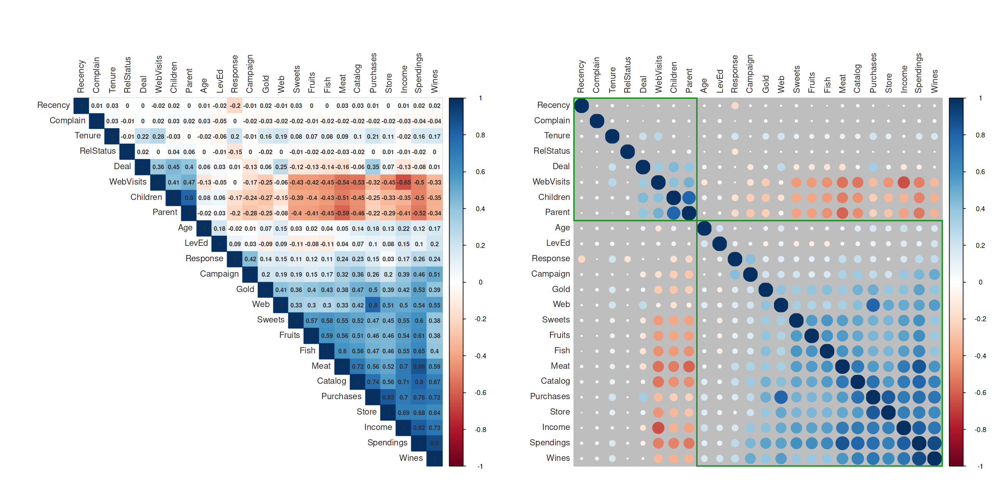

In [17]:
options(repr.plot.width=20, repr.plot.height=10)
par(mfrow = c(1, 2))
plot3 <- corrplot(corr = cor(ds_num),method="color",order="hclust", tl.col = "#302e2e", type="upper",addCoef.col="#302e2e", number.cex=.7,number.digits=2,diag=TRUE, bg="#302e2e")
plot4 <- corrplot(cor(ds_num),type="full", tl.col = "#302e2e", order="hclust",number.digits=1,diag=TRUE, bg="grey",addrect=2, rect.col="#1c9123")

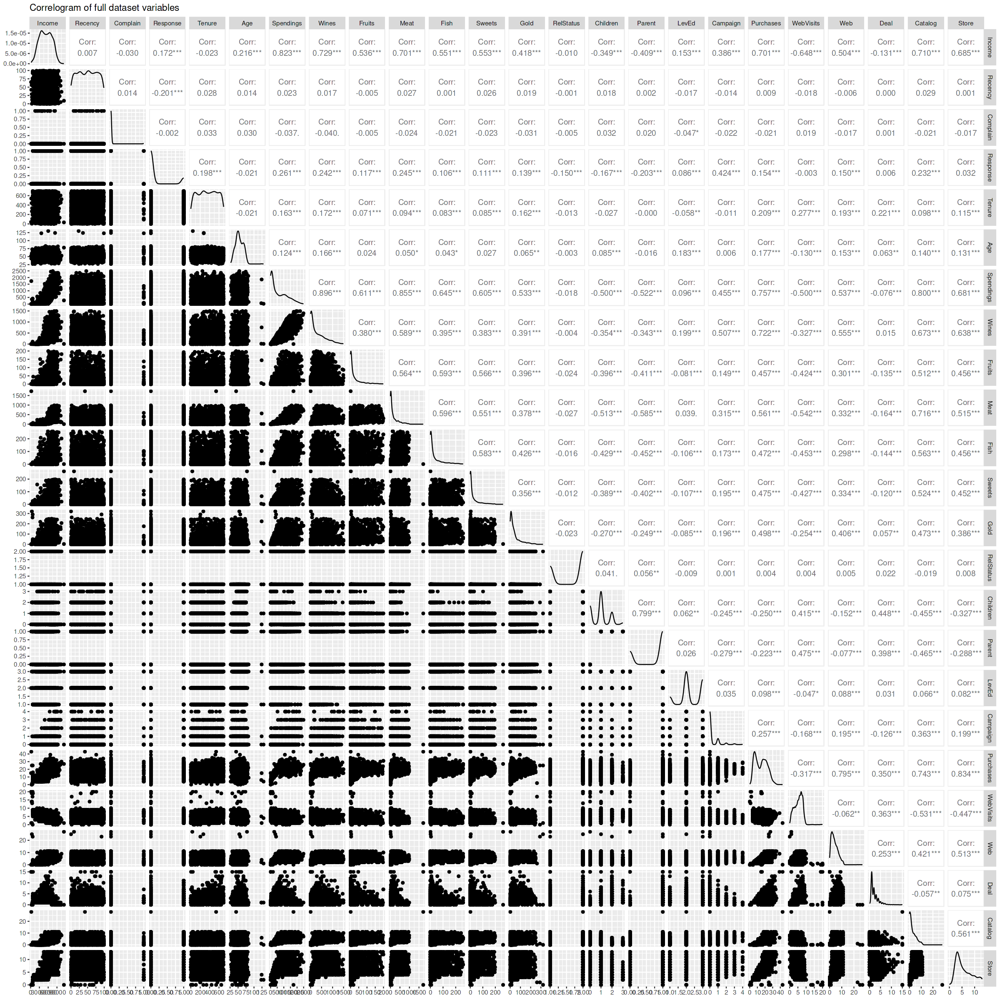

In [18]:
# Check correlations (as scatterplots), distribution and print correlation coefficient 
options(repr.plot.width=20, repr.plot.height=20)
ggpairs(ds_num, title="Correlogram of full dataset variables")

In [19]:
# Highly correlated variables table format
df_corr = cor(ds_num, use = "pairwise.complete.obs") 
hc = findCorrelation(df_corr, cutoff=0.7) 
hc = sort(hc) 
ds_num_mod = as.data.frame(ds_num)[,-c(hc)]
df_corr2 <- df_corr %>%
  as.data.frame() %>%
  mutate(var1 = rownames(.)) %>%
  gather(var2, value, -var1) %>%
  arrange(desc(value)) %>%
  group_by(value)

corr_tb <- setDT(df_corr2)[abs(value) > 0.7 & var1 != var2 & var1 != "Ttl_Rating"  & var2 != "Ttl_Rating"]
corr_tb <- corr_tb[!duplicated(corr_tb$value),]

l1 <- corr_tb$var1
l2 <- corr_tb$var2

corr_tb[sample(1:nrow(corr_tb), size = nrow(corr_tb)),] %>% 
  datatable(filter = 'top', options = list(
    pageLength = 5, autoWidth = T
  ))

HTML widgets cannot be represented in plain text (need html)

<div class="alert alert-block alert-success"> 
    
Above is the table showing the variables that have a correlation abs > 0.7.

There are 11 features that have been identified with high correlation with a cutoff set at 0.7: <b><i>Spendings</i></b>, <b><i>Income</i></b>, <b><i>Wines</i></b>, <b><i>Children</i></b>, <b><i>Purchases</i></b>, <b><i>Web</i></b>, <b><i>Parent</i></b>, <b><i>Meat</i></b>, <b><i>Store</i></b>,<b><i>Wines</i></b> and <b><i>Catalog</i></b>.
</div>


<a id="8"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">PCA</p>

<b>Principal Components Analysis(PCA)</b> is an unsupervised learning method that is often used to <u>reduce the dimensionality</u> of a dataset by transforming a large set into a lower dimensional set that still contains most of the information of the large set. Is a procedure to transform linearly correlated variables into a set of new variables that are called <i> principal components</i> that are linearly correlated.

The goal is to find a transformation such that:
* the transformed features are <u>linearly independent</u>
* <u>dimensionality can be reduced</u> by taking only the dimensions with highest importance
* those newly found dimensions should <u> minimize the projection error</u>
* the projected points should have <u>maximum spread</u> (i.e.: maximum variance)

<b>Advice: PCA works best on continuous numeric data.</b>

The steps of the PCA algorithm are as follows:

* Step I: Data Preparation -> involves cleaning, normalizing and standardizing the data

* Step II: Compute the Covariance Matrix -> the covariance matrix is calculated by computing the pairwise covariance between the different features in the dataset

* Step III: Compute the Eigenvectors and Eigenvalues -> the eigenvectors are the directions in which the data varies the most and the eigenvalues indicate the amount of variance explained by each eigenvector (PCA finds the eigenvectors and eigenvalues of the covariance matrix)

* Step IV: Choose the Principal Components -> the eigenvectors are sorted in decreasing order of their eigenvalues; the eigenvectors with the highest eigenvalues, called the principal components(pc), represent the directions of maximum variance in the data

* Step V: Project the Data onto the Principal Components -> involves multiplying the original data matrix by the eigenvector matrix, which results in a new dataset that has fewer dimensions

<div class="alert alert-block alert-success"> 
    
One of the main aims of PCA is to combine linearly correlated variables into a new set of variables that are called <i>principal components</i>, therefore the main prerequisites is to check whether the variables in the dataset are highly correlated amongst one another.

 The <b>Correlation Matrix</b> can help check whether or not the variables linearly dependent. If the average correlation is <u>above 0.3</u> or <u>below -0.3</u> we can say that there is evidence that the <u>variables are highly correlated amongst one another</u> and are hence <b>eligible for PCA</b>.
    
</div>

In [20]:
# Check PCA eligibility
# cor(ds_num)
mean(cor(ds_num))

[1] 0.1596167

<div class="alert alert-block alert-success"> 
    
The mean of the correlation between the dataset variables is ~0.1596 which is small. In theory this indicates that the variables of the dataset are <b>NOT</b> eligible for Principal Components Analysis, but for insights we are going to continue trying it. 
    
</div>

In [21]:
# Principal Component Analysis
PCA <- prcomp(ds_num, centre=TRUE, scale=TRUE)

<div class="alert alert-block alert-success"> 
    
There are two ways of <b>evaluating PCA</b>. First is to check if whether the principal components are capturing essence of the original variables and the second is to check if whether the principal components are independent or not.
</div>

In [22]:
summary(PCA)

Importance of components:
                          PC1    PC2     PC3     PC4     PC5     PC6     PC7
Standard deviation     2.8986 1.5644 1.24473 1.21755 1.01787 1.01612 0.99764
Proportion of Variance 0.3501 0.1020 0.06456 0.06177 0.04317 0.04302 0.04147
Cumulative Proportion  0.3501 0.4521 0.51660 0.57837 0.62154 0.66456 0.70603
                           PC8     PC9   PC10    PC11    PC12    PC13    PC14
Standard deviation     0.95192 0.91013 0.8612 0.80122 0.75608 0.75465 0.68095
Proportion of Variance 0.03776 0.03451 0.0309 0.02675 0.02382 0.02373 0.01932
Cumulative Proportion  0.74379 0.77830 0.8092 0.83595 0.85977 0.88350 0.90282
                          PC15    PC16    PC17    PC18    PC19    PC20    PC21
Standard deviation     0.65474 0.64397 0.61748 0.54796 0.53072 0.47294 0.41226
Proportion of Variance 0.01786 0.01728 0.01589 0.01251 0.01174 0.00932 0.00708
Cumulative Proportion  0.92068 0.93796 0.95385 0.96636 0.97810 0.98742 0.99450
                         PC22      PC2

<div class="alert alert-block alert-success"> 
    
* The first principal component explains <b>35.01%</b> of the total variation in the dataset.   
* The second principal component explains <b>10.20%</b> of the total variation in the dataset.
* The third principal component explains <b>6.45%</b> of the total variation in the dataset.
* The fourth principal component explains <b>6.17%</b> of the total variation in the dataset.
* The fifth principal component explains <b>4.31%</b> of the total variation in the dataset.
* etc.
    

There are <b>seven</b> PCs that capture <b> 70% </b> of the variance in the data, <b>ten</b> PCs that capture <b>80%</b> of the variance in the data, <b>forteenth</b> PCs that capture <b>90%</b> and <b>twenty-second</b> PCs that capture <b>100%</b>.
</div>

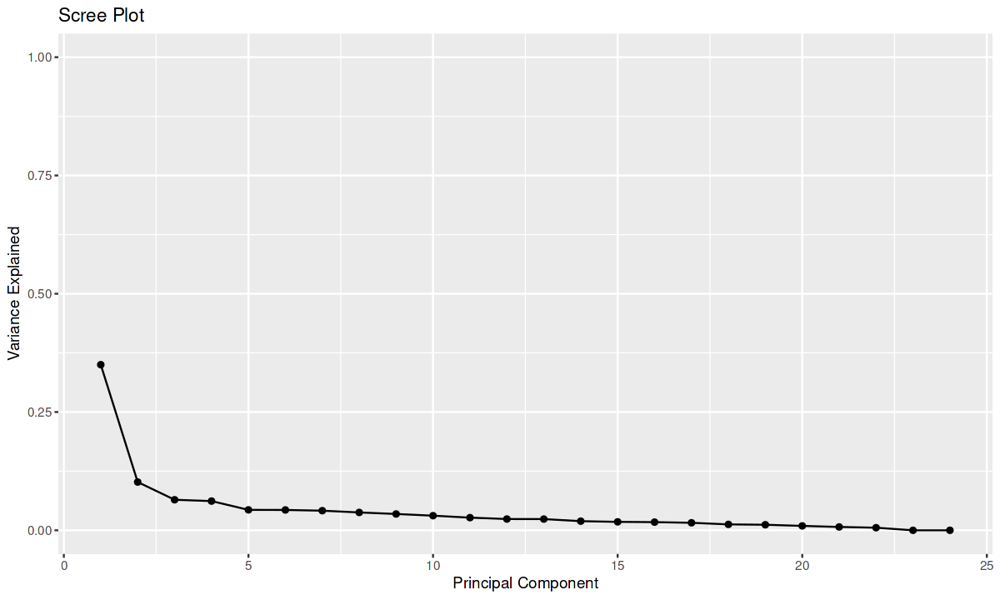

In [23]:
# Total Variance explained by each PC
var_explained = PCA$sdev^2 / sum(PCA$sdev^2)

# Scree plot
options(repr.plot.width=10, repr.plot.height=6)
qplot(c(1:24), var_explained) + 
  geom_line() + 
  xlab("Principal Component") + 
  ylab("Variance Explained") +
  ggtitle("Scree Plot") +
  ylim(0, 1)

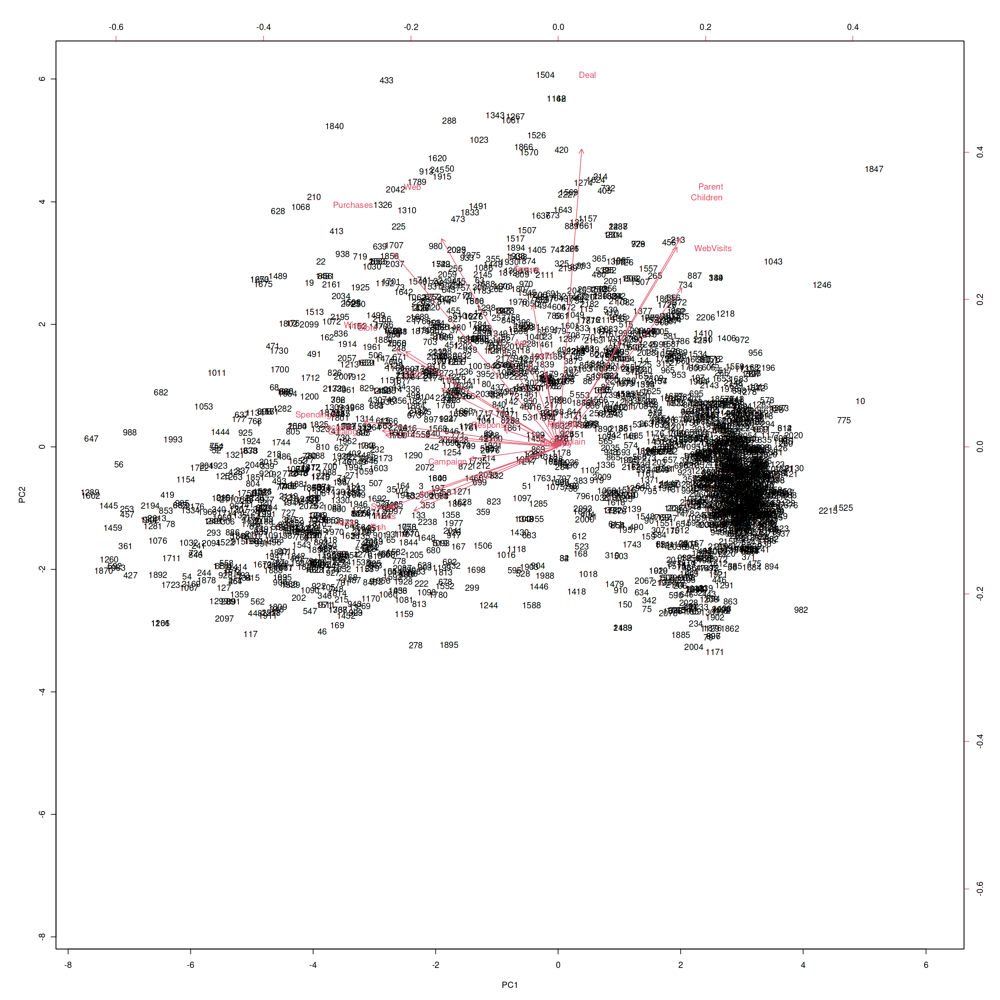

In [24]:
options(repr.plot.width=20, repr.plot.height=20) 
# Defaylt biplot
biplot(PCA, scale=0)

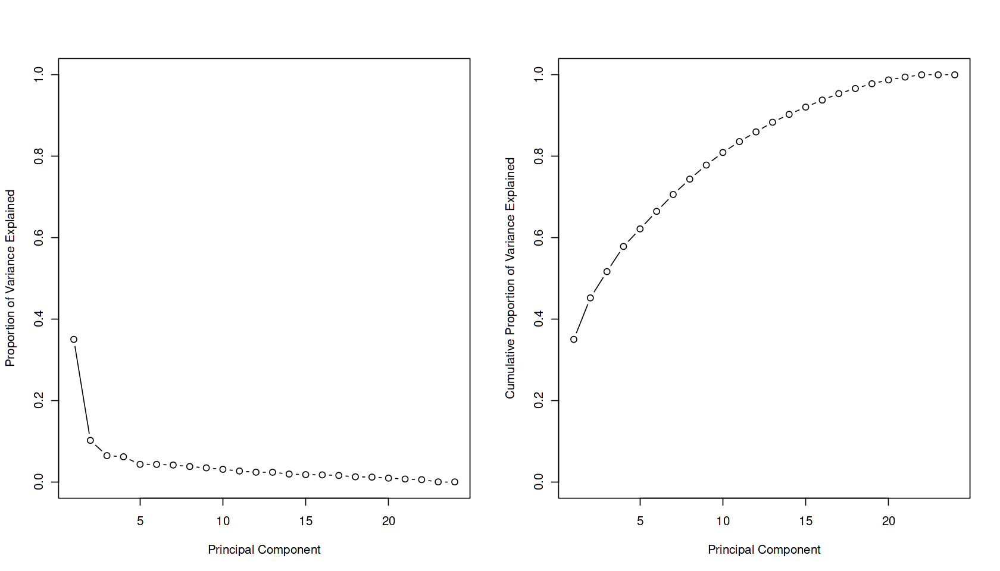

In [25]:
# Proportion of variance explained (PVE)
pr.var <- PCA$sdev^2

# We can then compute the proportion of variance explained by each principal component
pve=pr.var/sum(pr.var)

# We can plot the PVE explained by each component, as well as the cumulative PVE
options(repr.plot.width=14, repr.plot.height=8) 
par(mfrow = c(1, 2))
plot(pve,
xlab="Principal Component",
ylab="Proportion of Variance Explained",
ylim=c(0,1),
type='b')

plot(cumsum(pve),
xlab="Principal Component",
ylab="Cumulative Proportion of Variance Explained",
ylim=c(0,1),
type='b')

<div class="alert alert-block alert-success"> 
    
The numbers below show that although the graphs based on PC1 and PC2 give some insight about document types, <u>the first two PCs explain only small portion of the variability contained in the data, respectively <b>45.21%</b>.</u>
</div>

In [26]:
# Obtain principal components
PC <- PCA$x
PC1 <- PC[, 1]
PC2 <- PC[, 2]
PC3 <- PC[, 3]

# Print first few rows of scores
head(PC)

# Calculate correlation matrix
cor(PC)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24
1,-4.8907221,0.3853274,1.8232724,-1.9283035,1.6273546,0.3145069,1.1332334,-1.1350054,1.2637709,0.83893522,⋯,0.03913110,-1.65240070,0.06170558,0.77486023,0.76383550,-0.26480420,-0.2673983,-0.187150031,-1.116136e-15,5.551115e-17
2,2.9389064,-0.6272841,-0.5797355,1.1488913,1.0712033,1.1635692,0.6265264,0.9155272,1.0748996,0.04729518,⋯,0.04578311,-0.26711919,-0.27543601,-0.01858458,-0.08019989,-0.11625419,-0.3243860,0.008634365,-7.526307e-17,2.220446e-16
3,-2.2414956,-0.6378221,-0.8335939,-0.1954808,-0.5613128,0.6717515,-0.5610769,-1.1066463,-0.3668686,-1.52579628,⋯,-0.60524680,-0.13127720,1.21478567,-0.25147540,-0.52833228,-0.34796768,-0.5686395,0.045491111,2.090743e-16,0.000000e+00
4,2.8872214,-0.9790229,-0.1605194,-0.2458173,-1.1801463,0.5649186,-0.6144904,0.3718989,-0.7955204,-0.14067164,⋯,-0.03773059,-0.07087789,0.08856706,-0.06762193,0.26408716,0.03459338,0.3811832,-0.153965148,7.747121e-16,-2.775558e-17
5,0.2240211,0.8654055,-1.3891117,0.2697488,-0.6151168,-0.9291208,0.2887257,0.5291260,-1.2438134,1.06857988,⋯,-0.24201692,0.19243038,0.27695138,0.39560480,-0.16541093,-0.24773199,0.1747757,0.559477960,-1.138705e-16,-2.775558e-16
6,-0.7885825,1.2184464,-0.6751909,1.1080081,-0.7752160,0.8315055,-0.5750493,-0.7469566,-1.1108566,-0.10331146,⋯,-0.19352653,0.30703124,-0.46222112,0.38106418,0.77648627,0.19266752,-0.1644699,0.113234662,1.535631e-16,-1.110223e-16


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24
PC1,1.000000e+00,1.688168e-14,1.069157e-16,3.328318e-16,1.085131e-16,1.537413e-17,-2.275741e-16,2.406390e-16,5.625905e-16,5.280085e-17,⋯,-2.000394e-16,-7.257339e-18,3.213001e-16,4.747805e-16,7.275995e-17,5.499032e-16,-3.080331e-16,2.660415e-16,0.778846675,0.027744949
PC2,1.688168e-14,1.000000e+00,1.239857e-16,-1.324914e-16,2.169649e-16,-1.789198e-16,6.960796e-17,-1.387074e-16,5.676229e-17,-3.218337e-16,⋯,2.039893e-16,2.268103e-16,9.819524e-17,1.068271e-16,-3.318898e-16,-9.879164e-17,-1.666728e-16,2.799609e-16,0.055389127,-0.231762713
PC3,1.069157e-16,1.239857e-16,1.000000e+00,2.078208e-16,7.390300e-17,-6.104939e-16,1.415070e-17,-3.282090e-16,1.952917e-16,-4.394393e-17,⋯,-4.299298e-17,-2.984071e-17,1.004279e-16,-1.466567e-17,-4.473497e-17,-2.141017e-16,-2.457904e-16,-2.403704e-16,0.084155783,-0.157354181
PC4,3.328318e-16,-1.324914e-16,2.078208e-16,1.000000e+00,1.261797e-16,-4.483718e-15,7.100961e-18,-6.869434e-17,9.672183e-19,-2.382167e-17,⋯,9.909254e-17,6.460862e-17,7.868367e-17,3.738565e-16,3.843320e-16,6.857750e-17,-7.423090e-17,1.184914e-15,-0.174207326,-0.281135774
PC5,1.085131e-16,2.169649e-16,7.390300e-17,1.261797e-16,1.000000e+00,-5.776789e-17,-9.318230e-17,-6.547363e-16,6.040996e-16,-3.560076e-16,⋯,-5.095081e-16,-8.756681e-17,-4.560230e-17,2.509862e-16,6.429970e-16,-1.380713e-16,6.485241e-17,5.123206e-16,-0.271714281,0.003651567
PC6,1.537413e-17,-1.789198e-16,-6.104939e-16,-4.483718e-15,-5.776789e-17,1.000000e+00,-2.445783e-16,-3.339107e-16,2.503561e-16,-6.355357e-16,⋯,4.440756e-17,1.563008e-16,4.664996e-17,4.979414e-17,-3.240158e-16,2.122121e-17,4.433327e-18,-4.056370e-16,0.109106849,0.519843093
PC7,-2.275741e-16,6.960796e-17,1.415070e-17,7.100961e-18,-9.318230e-17,-2.445783e-16,1.000000e+00,1.055195e-15,-1.375893e-17,5.064964e-16,⋯,-5.914098e-17,2.073701e-16,2.316909e-16,2.645830e-17,-5.485845e-17,4.873650e-16,5.222136e-16,-2.395246e-16,0.179093528,0.124898814
PC8,2.406390e-16,-1.387074e-16,-3.282090e-16,-6.869434e-17,-6.547363e-16,-3.339107e-16,1.055195e-15,1.000000e+00,-3.079363e-16,8.004959e-17,⋯,1.159721e-16,-2.319272e-16,-4.792520e-18,-4.826761e-16,-4.215526e-16,-3.183396e-16,-3.116641e-16,4.953530e-16,-0.151463511,-0.018851252
PC9,5.625905e-16,5.676229e-17,1.952917e-16,9.672183e-19,6.040996e-16,2.503561e-16,-1.375893e-17,-3.079363e-16,1.000000e+00,-5.248422e-16,⋯,-6.771883e-17,1.499814e-16,8.114322e-17,-1.654155e-16,-5.870329e-17,1.736321e-16,-2.965791e-16,-5.078752e-16,-0.249815104,0.131717207
PC10,5.280085e-17,-3.218337e-16,-4.394393e-17,-2.382167e-17,-3.560076e-16,-6.355357e-16,5.064964e-16,8.004959e-17,-5.248422e-16,1.000000e+00,⋯,-7.691726e-17,3.904609e-17,-4.973409e-16,-5.934293e-16,-5.948454e-16,-1.521884e-16,-1.318540e-17,1.071386e-15,-0.115438355,0.150014731


<a id="9"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">K-Means Clustering</p>

<b>K-Means clustering</b> is a popular unsupervised machine learning algorithm used for grouping similar data points in a dataset into a specified number of clusters, with each cluster represented by its centroid. The algorithm works by iteratively assigning data points to their closest cluster centroid and then recalculating the centroid of each cluster based on the newly assigned data points. The process is repeated until the clusters stabilize or until a specified maximum number of iterations is reached.

A <b><i>good cluster</i></b> is one for which the within-cluster variation is as small as possible.


<b>Advice: K is a user-specified parameter and requires some domain knowledge or trial and error.</b>

The steps of the K-Means algorithm are as follows:

* Step I: Choose the number of clusters (K) -> determine the number of clusters (K) that the algorithm will use to group the data

* Step II: Initialize the centroids -> randomly select K data points as the initial centroids for each cluster

* Step III: Assign data points to the nearest centroid -> for each data point, calculate the distance to each centroid and assign it to the nearest centroid

* Step IV: Update the centroids -> calculate the mean of all data points assigned to each centroid and update the centroid position

* Step V:Repeat steps III and IV until the centroids no longer move significantly or a maximum number of iterations is reached

The algorithm may <b>converge to a local optimum</b>, meaning that the final clusters may depend on the initial random initialization of the centroids. Therefore, it is common practice to <u>run the algorithm multiple times</u> with different initial centroids and choose the solution with the <u>lowest overall within-cluster sum of squares (WSS) as the final result</u>.

<div class="alert alert-block alert-success"> 
    
In order to determine the optimal value of k for our dataset, we will experiment with different values using a trial and error approach.
    
</div>

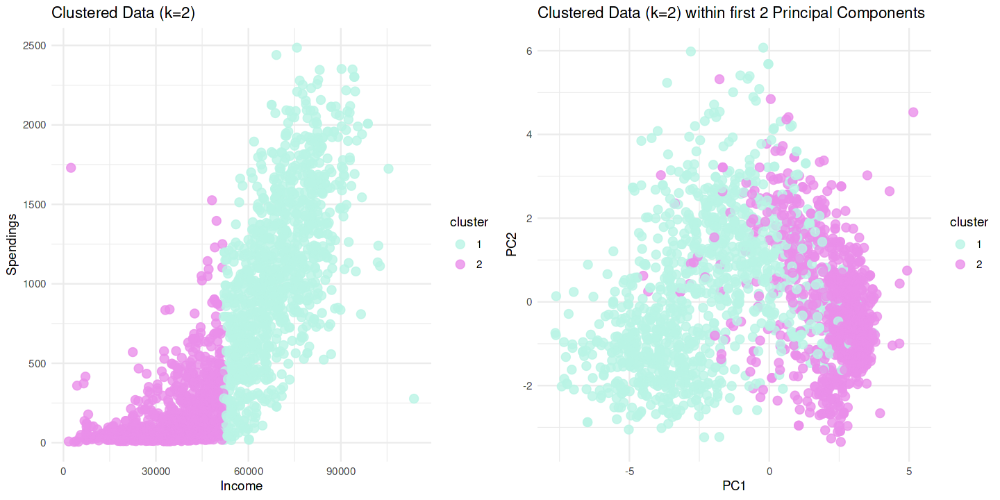

In [27]:
# Fit k-means clustering with k=2
km_out_2 <- kmeans(ds_num, 2)
# km_out_2

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_2$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6) 
require(gridExtra)

ds_num_k2 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=2)", x = "Income", y = "Spendings")

ds_num_k2_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=2) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k2, ds_num_k2_pc, ncol=2)

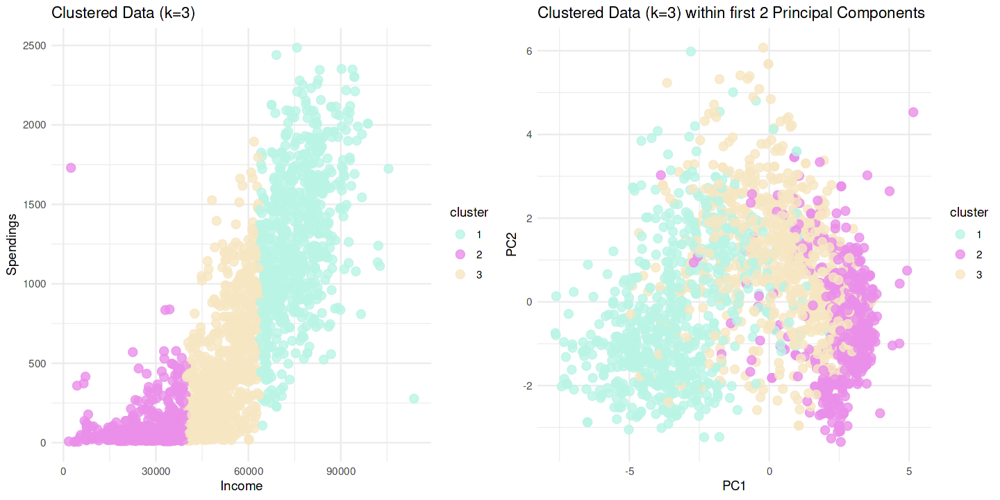

In [28]:
# Fit k-means clustering with k=3
km_out_3 <- kmeans(ds_num, 3)
# km_out_3

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_3$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6) 
require(gridExtra)

ds_num_k3 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=3)", x = "Income", y = "Spendings")

ds_num_k3_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=3) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k3, ds_num_k3_pc, ncol=2)

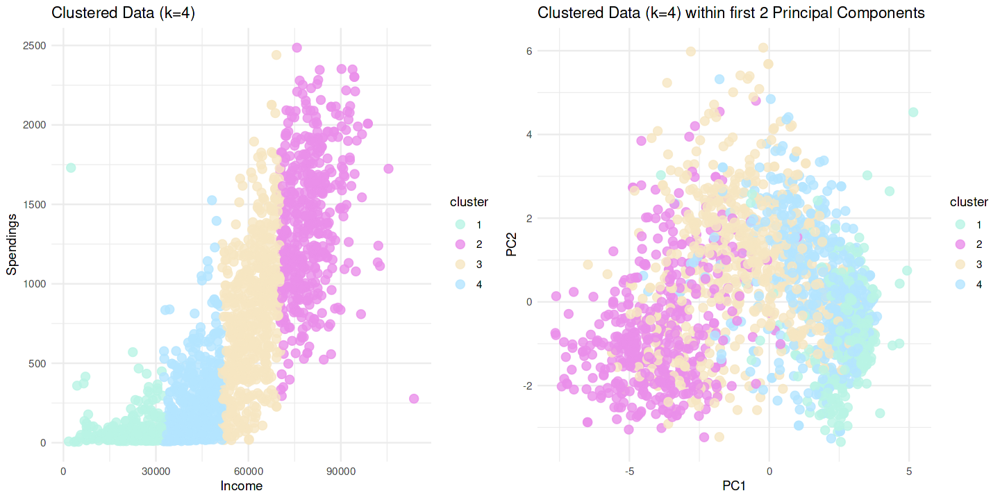

In [29]:
# Fit k-means clustering with k=4
km_out_4 <- kmeans(ds_num, 4)
# km_out_4

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_4$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6) 
require(gridExtra)

ds_num_k4 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2","#B4E4FF")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=4)", x = "Income", y = "Spendings")

ds_num_k4_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2","#B4E4FF")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=4) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k4, ds_num_k4_pc, ncol=2)

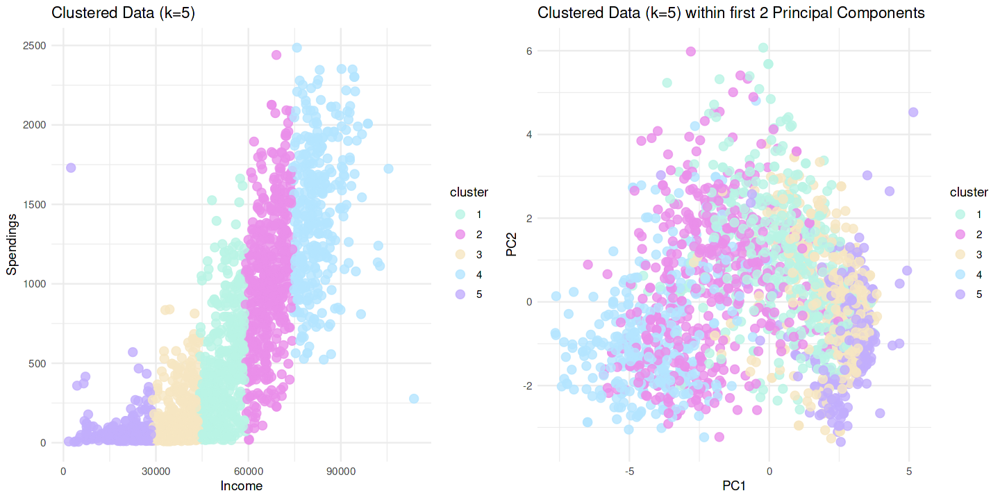

In [30]:
# Fit k-means clustering with k=5
km_out_5 <- kmeans(ds_num, 5)
# km_out_5

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_5$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6)  
require(gridExtra)

ds_num_k5 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2","#B4E4FF", "#C1AEFC")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=5)", x = "Income", y = "Spendings")

ds_num_k5_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2","#B4E4FF", "#C1AEFC")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=5) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k5, ds_num_k5_pc, ncol=2)

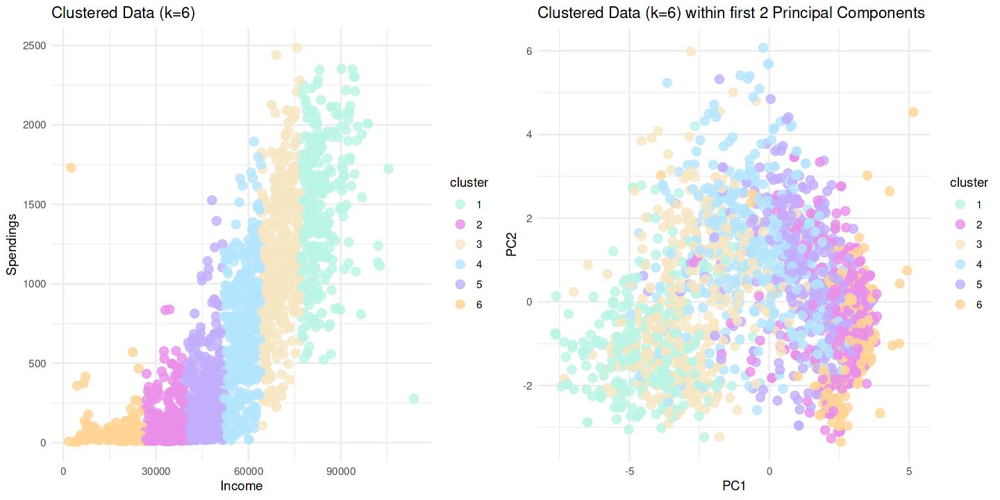

In [31]:
# Fit k-means clustering with k=6
km_out_6 <- kmeans(ds_num, 6)
# km_out_6

# Add cluster assignments to original data
ds_num_clustered <- cbind(ds_num, cluster = as.factor(km_out_6$cluster))

# Plot clustered data using ggplot2
options(repr.plot.width=12, repr.plot.height=6)  
require(gridExtra)

ds_num_k6 <- ggplot(ds_num_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2", "#B4E4FF", "#C1AEFC", "#FFD495")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=6)", x = "Income", y = "Spendings")

ds_num_k6_pc <- ggplot(ds_num_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2", "#B4E4FF", "#C1AEFC", "#FFD495")) +
  theme_minimal() +
  labs(title = "Clustered Data (k=6) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_k6, ds_num_k6_pc, ncol=2)

<div class="alert alert-block alert-success"> 
    
<b>WSS</b> (Within-cluster Sum of Squares) measures the total distance between each data point and its assigned cluster centroid, summed over all clusters. By computing the WSS for various values of k and plotting the results, we can determine the optimal number of clusters to use for a given dataset. The idea is to choose a value of k that provides a good balance between having small WSS values (which indicates tight clustering) and not having too many clusters (which can lead to overfitting).

</div>


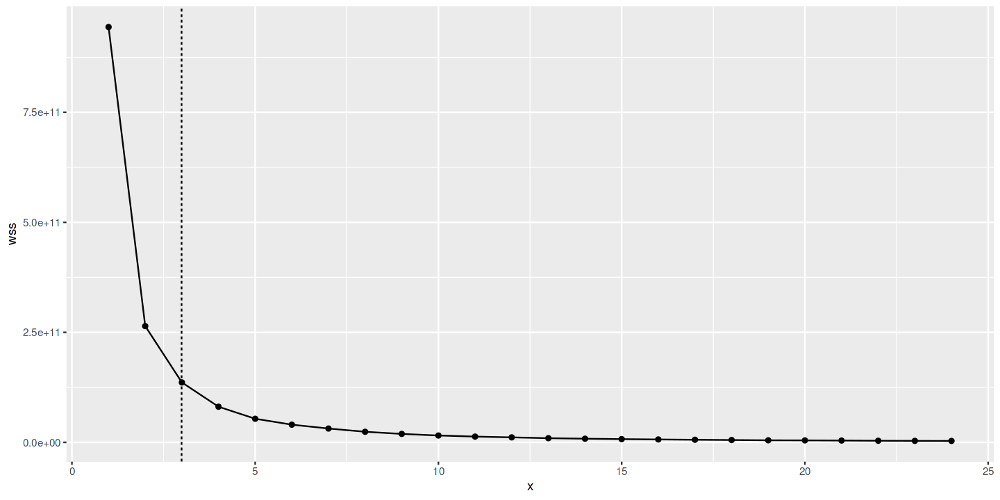

In [32]:
# Compute WSS for various values of k
wss <- sapply(1:24, function(k){kmeans(ds_num, k, nstart=10 )$tot.withinss})

# Plot the wss for each value of k
ggplot(data.frame(x=1:24, wss=wss), aes(x=x, y=wss)) +
  geom_point() +
  geom_line() +
  geom_vline(xintercept=3, linetype=2)


<div class="alert alert-block alert-success"> 
The resulting plot of WSS values for each value of k can be used to visually identify the <b><i>elbow point</i></b> which is the point on the plot where the rate of decrease in WSS starts to slow down. This point represents a good trade-off between small WSS values and a small number of clusters, and is often chosen as the optimal number of clusters. In our situation, a vertical line is added to the plot at <b>x=3</b> to indicate a possible elbow point, therefore we will use three clusters for our analysis.
</div>

K-means clustering with 3 clusters of sizes 713, 725, 767

Cluster means:
    Income  Recency    Complain  Response   Tenure      Age  Spendings
1 75467.98 49.02805 0.007012623 0.2342216 345.0463 55.82048 1273.37868
2 28089.61 48.48414 0.016551724 0.1158621 352.4386 49.89379   93.58897
3 51583.42 49.53716 0.005215124 0.1043025 362.9713 56.82660  464.97653
      Wines    Fruits      Meat     Fish   Sweets     Gold RelStatus  Children
1 621.02665 56.413745 384.23001 81.40112 59.06171 71.24544  1.640954 0.4712482
2  29.84138  5.873103  25.28138  9.06069  6.01931 17.51310  1.652414 1.1200000
3 271.02086 17.569752  91.47066 24.09126 16.91656 43.90743  1.641460 1.2333768
     Parent    LevEd   Campaign Purchases WebVisits      Web     Deal   Catalog
1 0.3997195 2.311360 0.62973352 21.008415  3.308555 5.538569 1.663394 5.3239832
2 0.8413793 2.117241 0.08965517  7.882759  6.908966 2.142069 2.144828 0.5296552
3 0.8917862 2.362451 0.18513690 15.767927  5.741851 4.607562 3.091265 2.1395046
     S

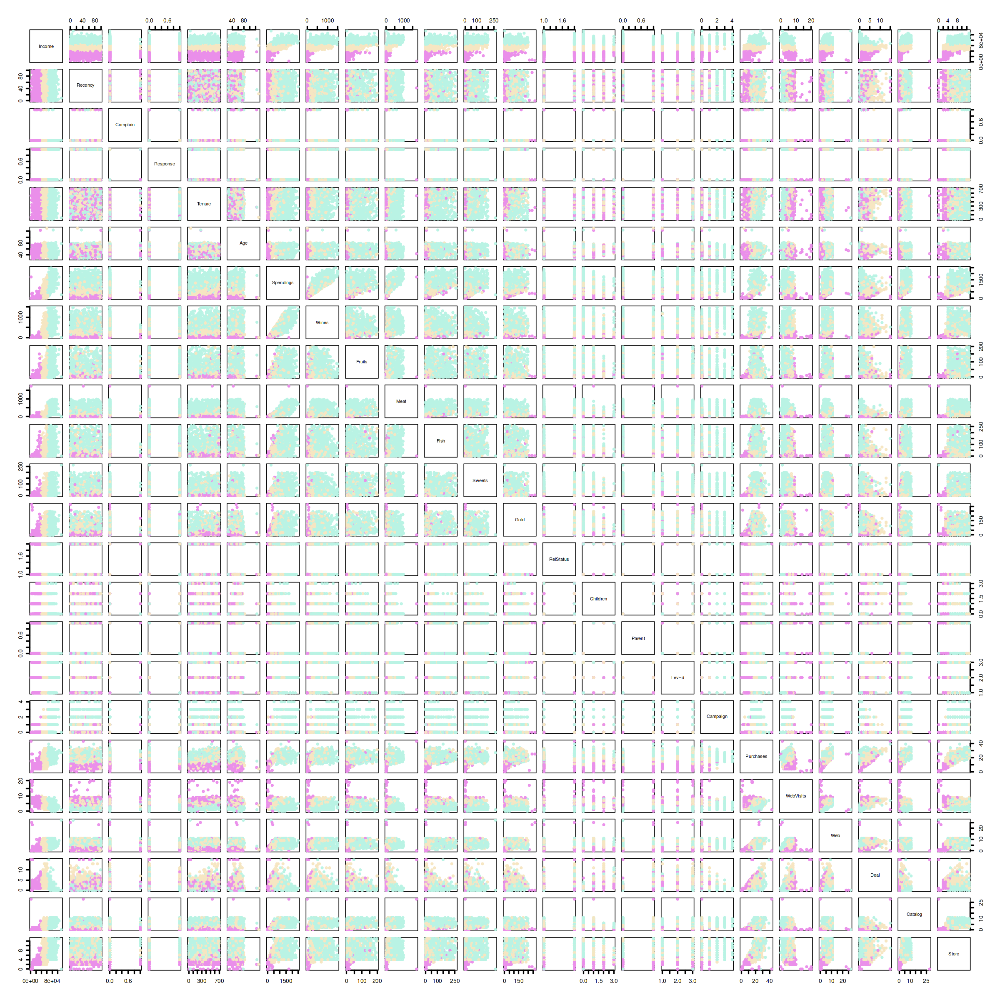

In [33]:
# Cluster assignments for k=3 model
km_out_3
options(repr.plot.width=20, repr.plot.height=20) 

# Assign cluster labels based on cluster assignments
cluster_labels <- ifelse(km_out_3$cluster == 1, "Cluster 1",
                         ifelse(km_out_3$cluster == 2, "Cluster 2", "Cluster 3"))

# Plot the data with colored clusters and cluster labels
cluster_colors <- c("#B9F3E4", "#EA8FEA", "#F6E6C2")
plot(ds_num,col=cluster_colors[km_out_3$cluster],cex=0.5,pch=1,lwd=2)
text(ds_num, labels = cluster_labels, col = km_out_3$cluster)

<a id="10"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Hierarchical Clustering</p>

<b>Hierarchical clustering(HC)</b> is an unsupervised machine learning algorithm used for grouping similar data points in a dataset into a hierarchy of clusters. In this algorithm, each data point is initially considered as its own cluster, and the algorithm iteratively combines clusters into larger ones until all data points belong to a single cluster.

Hierarchical clustering produces a dendrogram that displays the hierarchy of the clusters, with the height of the branches indicating the degree of similarity between clusters. The dendrogram can be used to determine the optimal number of clusters to use for downstream analysis.

<b>Advice: Hierarchical clustering is more suitable for datasets with mixed data types.</b>

The steps of the HC algorithm are as follows:

* Step I: Begin with each data point as a separate cluster 
* Step II: Compute the distance matrix -> calculate the distance or similarity between each pair of clusters using a distance metric(i.e.: Euclidean distance, Manhattan distance,correlation coefficient, etc.)
* Step III: Merge the closest clusters -> find the closest pair of clusters based on the distance matrix and merge them into a single cluster
* Step IV: Recalculate the distance matrix -> update the distance matrix to reflect the newly formed cluster by recalculating the distance or similarity between the merged cluster and the remaining clusters
* Step V: Repeat steps III and IV until all data points belong to a single cluster: Continue to merge the closest clusters and update the distance matrix until all data points are in the same cluster.

<b><i>Linkage method</i></b> is a technique used in hierarchical clustering to determine how clusters are merged or divided based on the similarity or distance between data points. The choice of linkage method depends on the research question, the goals of the analysis, and the characteristics of the data. It is often recommended to try different linkage methods and examine the resulting dendrograms to determine the best method for a given dataset.

There are several linkage methods commonly used in HC including:

<i>Ward linkage</i>: This method defines the distance between two clusters as the sum of squared differences between each point and the centroid of the merged cluster and is generally preferred when the goal is to form well-separated clusters of similar size

<i>Complete linkage</i>: This method defines the distance between two clusters as the maximum distance between any two points in the two clusters and is preferred when the goal is to capture distinct groups with a large difference in similarity.
    
<i>Average linkage</i>: This method defines the distance between two clusters as the average distance between all pairs of points in the two clusters and s preferred when the goal is to form more balanced clusters of similar size.

 <i>Single linkage</i>: This method defines the distance between two clusters as the shortest distance between any two points in the two clusters and is typically used when the goal is to identify long,thin clusters.

<div class="alert alert-block alert-success"> 
    We are going to construct dendrograms by using <b>Euclidean</b> method for calculating the distance between observations and different linkage methods like <b>ward.D</b>, <b>complete</b>, <b>average</b> & <b>single</b>.
</div>


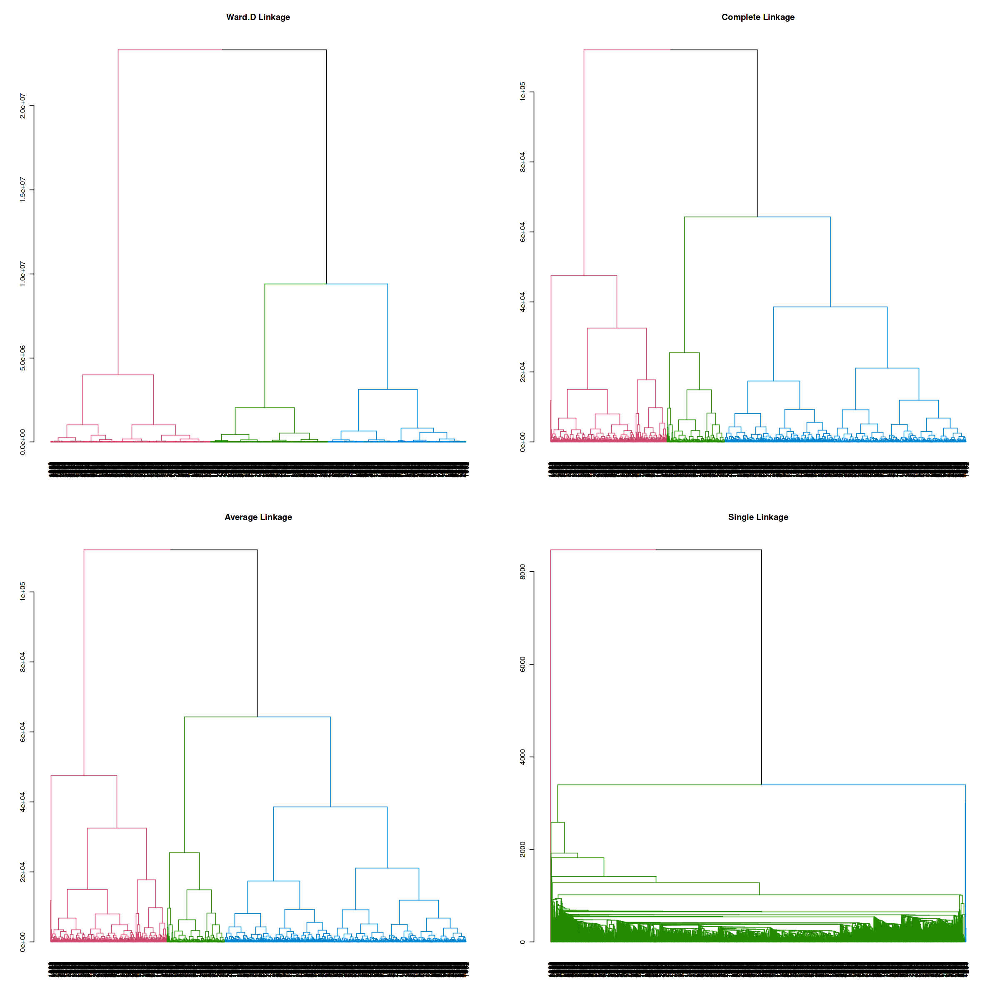

In [34]:
Hierarchical_Cluster_distances <- dist(ds_num, method="euclidean")

# Ward.D Method
Hierarchical_Cluster <- hclust(Hierarchical_Cluster_distances, method="ward.D")

# Complete Method
Hierarchical_Cluster_Complete <- hclust(Hierarchical_Cluster_distances, method="complete")

# Average Method
Hierarchical_Cluster_Average <- hclust(Hierarchical_Cluster_distances, method="average")

# Single Method
Hierarchical_Cluster_Single <- hclust(Hierarchical_Cluster_distances, method="single")

options(repr.plot.width=20, repr.plot.height=20) 
par(mfrow=c(2,2))
as.dendrogram(Hierarchical_Cluster) %>% color_branches(k=3) %>% plot(horiz=FALSE, main = "Ward.D Linkage") 
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=3) %>% plot(horiz=FALSE, main = "Complete Linkage") 
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=3) %>% plot(horiz=FALSE, main = "Average Linkage") 
as.dendrogram(Hierarchical_Cluster_Single) %>% color_branches(k=3) %>% plot(horiz=FALSE, main = "Single Linkage") 

<div class="alert alert-block alert-success"> 
Each dendrogram shows how the data points are grouped into clusters at different levels of similarity. The vertical height of the branches represents the distance between clusters or data points, while the horizontal lines represent the clusters or individual data points.The dendrograms are colored based on the number of clusters, which is set to 3 in this case.
</div>

<div class="alert alert-block alert-success"> 
Next we are going to set the number of clusters to 4. 
</div>

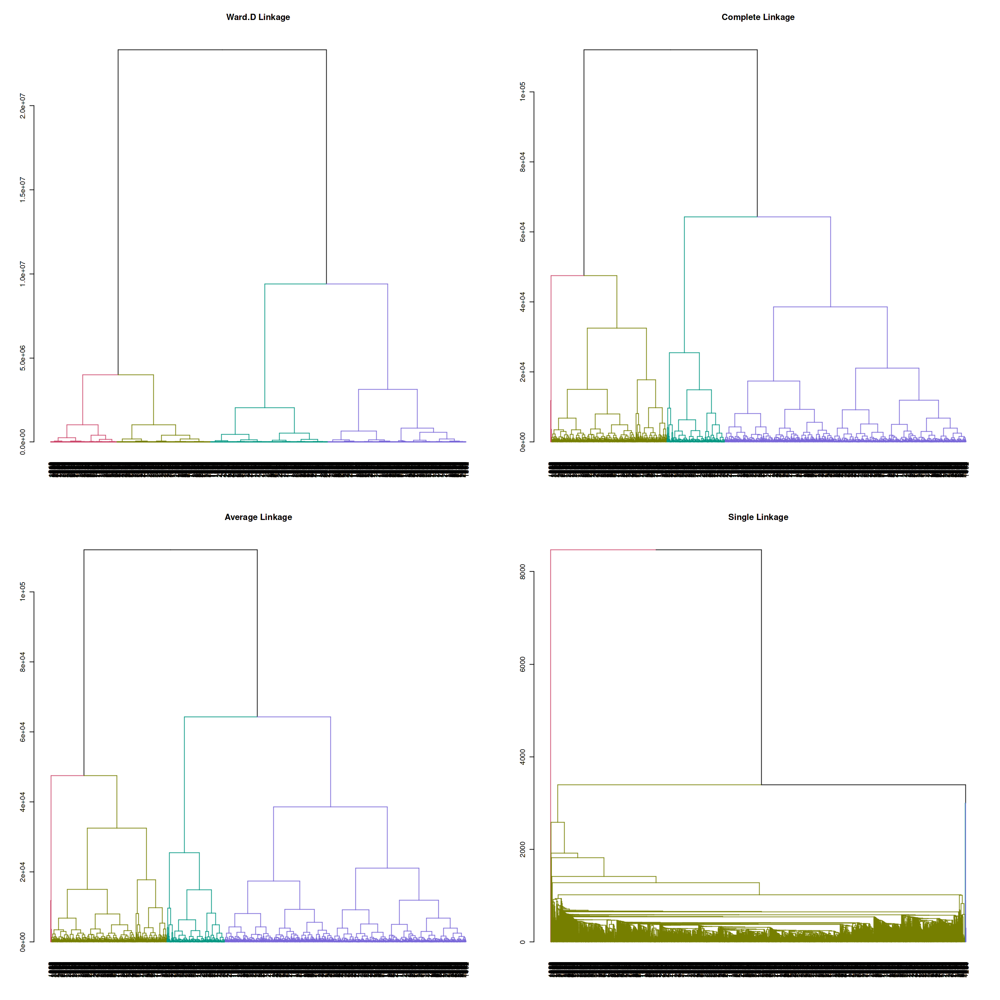

In [35]:
options(repr.plot.width=20, repr.plot.height=20) 
par(mfrow=c(2,2))
as.dendrogram(Hierarchical_Cluster) %>% color_branches(k=4) %>% plot(horiz=FALSE, main = "Ward.D Linkage") 
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=4) %>% plot(horiz=FALSE, main = "Complete Linkage") 
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=4) %>% plot(horiz=FALSE, main = "Average Linkage") 
as.dendrogram(Hierarchical_Cluster_Single) %>% color_branches(k=4) %>% plot(horiz=FALSE, main = "Single Linkage") 

<div class="alert alert-block alert-success"> 
Next we are going to set the number of clusters to 6. 
</div>

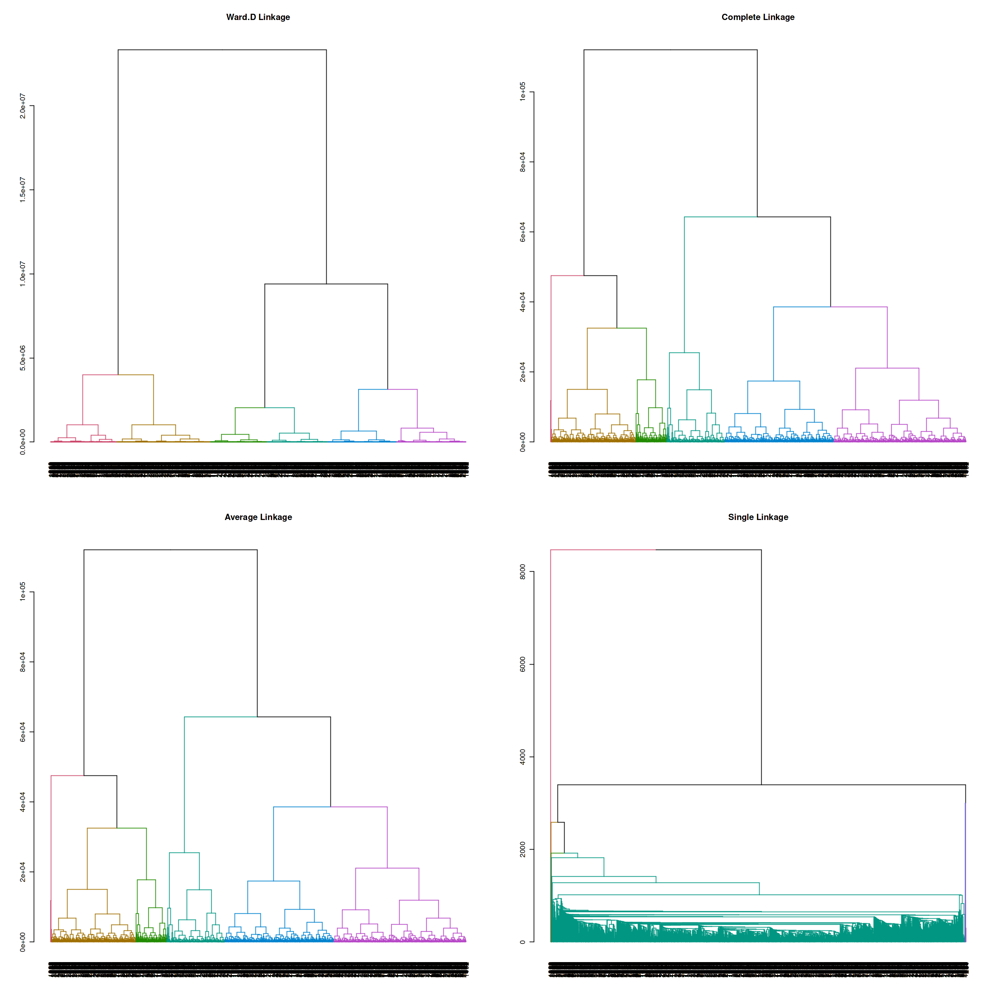

In [36]:
options(repr.plot.width=20, repr.plot.height=20) 
par(mfrow=c(2,2))
as.dendrogram(Hierarchical_Cluster) %>% color_branches(k=6) %>% plot(horiz=FALSE, main = "Ward.D Linkage") 
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=6) %>% plot(horiz=FALSE, main = "Complete Linkage") 
as.dendrogram(Hierarchical_Cluster_Complete) %>% color_branches(k=6) %>% plot(horiz=FALSE, main = "Average Linkage") 
as.dendrogram(Hierarchical_Cluster_Single) %>% color_branches(k=6) %>% plot(horiz=FALSE, main = "Single Linkage") 

<div class="alert alert-block alert-success"> 
    
The computed dendrograms using the Ward.D method, tends to produce well-separated clusters of similar size, while using the Complete method tends to produce clusters that are more spread out and uneven in size. The computed dendrograms using the Average method produces clusters that are more balanced in size compared to the Complete method and ones computed using the Single method tends to produce long and thin clusters that are not relevant in this case.
</div>

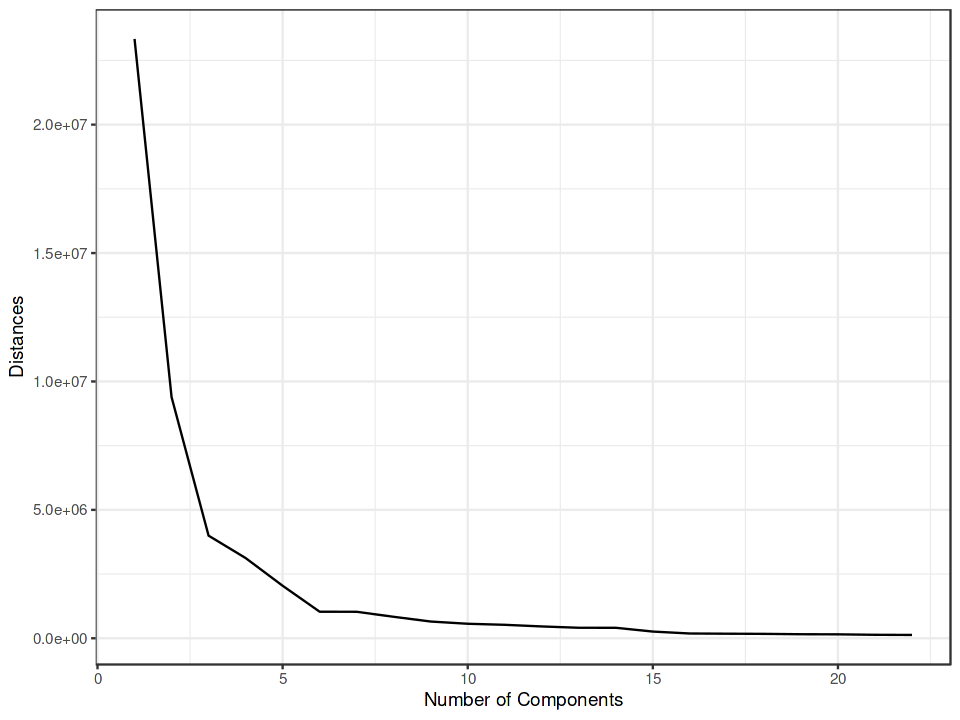

In [37]:
num <- nrow(ds_num) - 1
df1 <- cbind(as.data.frame(Hierarchical_Cluster$height[length(Hierarchical_Cluster$height):1]), c(1:num))
colnames(df1) <- c("distances","index")
options(repr.plot.width=8, repr.plot.height=6) 
ggplot(df1[c(1:22),], aes(x=index, y=distances)) + geom_line() + xlab("Number of Components") +ylab("Distances") + theme_bw()

<div class="alert alert-block alert-success"> 
The elbow curve starts at three or six, which suggest that the cutoff for Hierarchical Clustering should be three or six. We are going to keep it at three going forward.
</div>

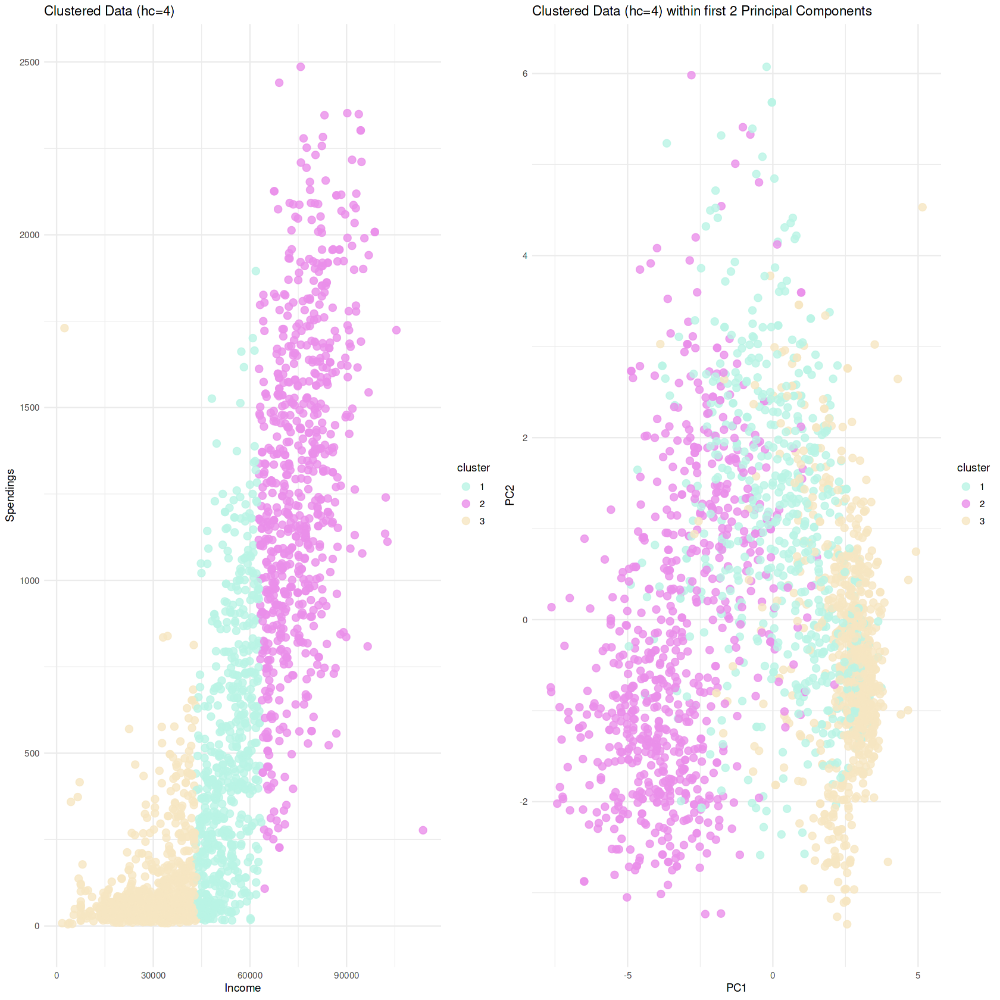

In [38]:
# Cluster assignment
hc_clusters=cutree(Hierarchical_Cluster, 3)

# Add cluster assignments to original data
ds_num_hc_clustered <- cbind(ds_num, cluster = as.factor(hc_clusters))

# Plot clustered data using ggplot2
options(repr.plot.width=14, repr.plot.height=14)  
require(gridExtra)

ds_num_hc3 <- ggplot(ds_num_hc_clustered, aes(x = Income, y = Spendings, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2", "#B4E4FF", "#C1AEFC", "#FFD495")) +
  theme_minimal() +
  labs(title = "Clustered Data (hc=4)", x = "Income", y = "Spendings")

ds_num_hc3_pc <- ggplot(ds_num_hc_clustered, aes(x = PC1, y = PC2, color = cluster)) +
  geom_point(alpha = 0.8, size = 3) +
  scale_color_manual(values = c("#B9F3E4", "#EA8FEA", "#F6E6C2", "#B4E4FF", "#C1AEFC", "#FFD495")) +
  theme_minimal() +
  labs(title = "Clustered Data (hc=4) within first 2 Principal Components", x = "PC1", y = "PC2")

grid.arrange(ds_num_hc3, ds_num_hc3_pc, ncol=2)

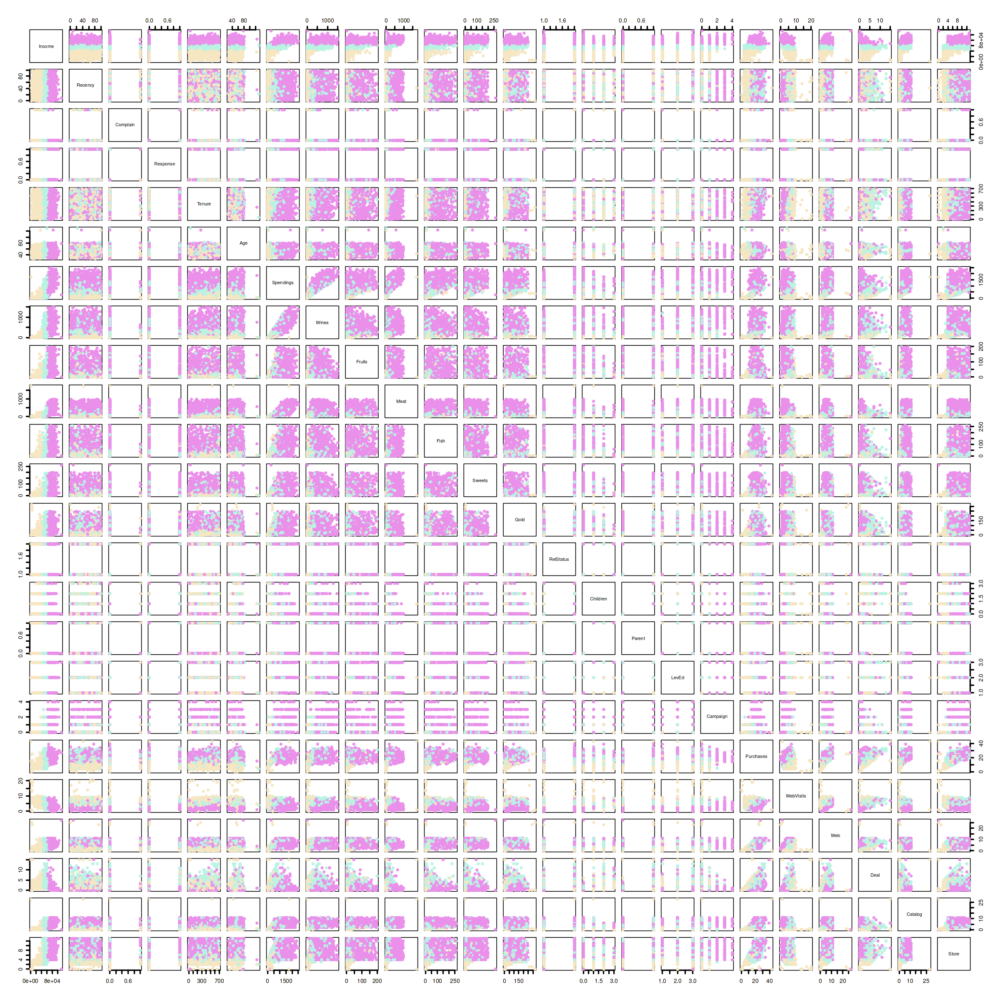

In [39]:
# Cluster assignments for hc=3 model
options(repr.plot.width=20, repr.plot.height=20) 

# Assign cluster labels based on cluster assignments
cluster_labels <- ifelse(hc_clusters == 1, "Cluster 1",
                         ifelse(hc_clusters == 2, "Cluster 2", "Cluster 3"))

# Plot the data with colored clusters and cluster labels
cluster_colors <- c("#B9F3E4", "#EA8FEA", "#F6E6C2")
plot(ds_num,col=cluster_colors[hc_clusters],cex=0.5,pch=1,lwd=2)
text(ds_num, labels = cluster_labels, col = hc_clusters)

<div class="alert alert-block alert-success"> 
The fact that both the k-means and hierarchical clustering methods suggested that 3 clusters were appropriate is a strong indication that this is a meaningful and informative way to segment the customer data. The final result suggests that there are <b>three distinct subgroups within the customer population that have unique characteristics</b>. Unfortunately, as the variables of the dataset are not eligible for PCA, we can plot the clusters against some relevant variables such as <i>Income</i>, <i>Spendings</i>, <i>Purchases</i>.

</div>

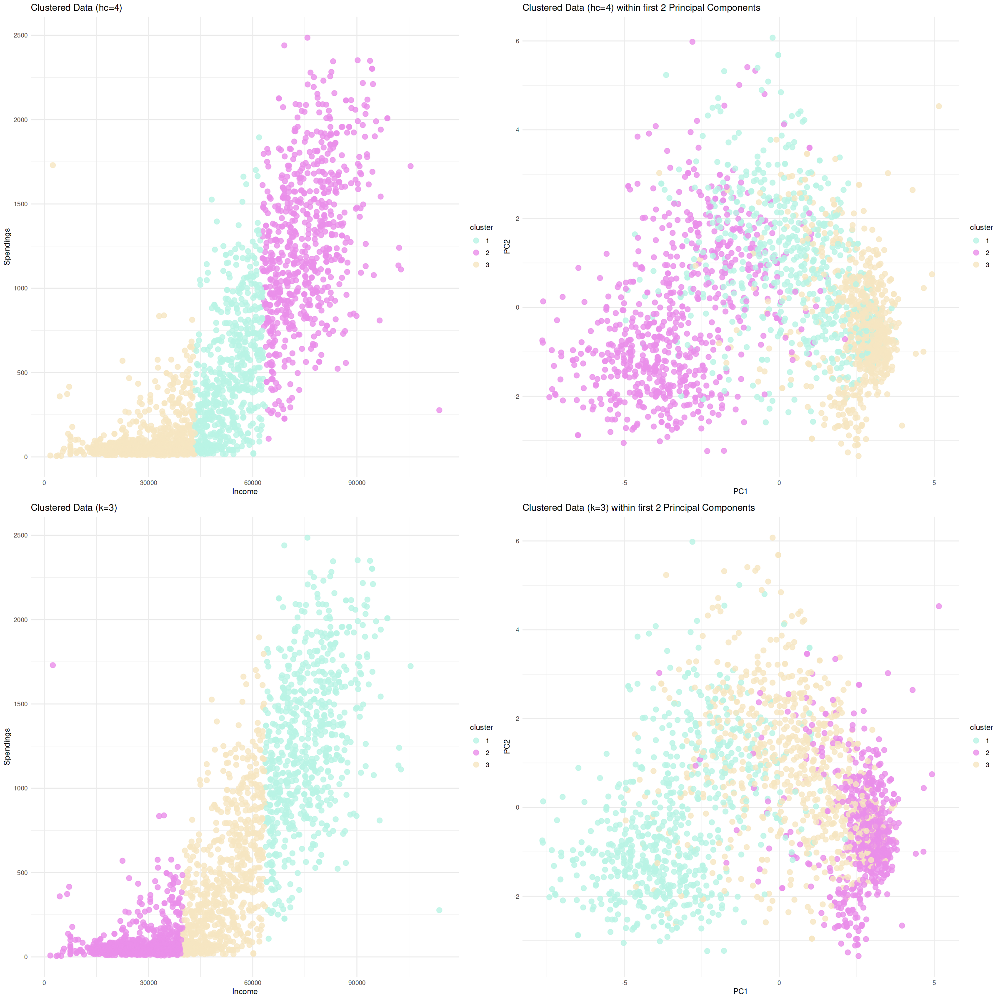

In [40]:
grid.arrange(ds_num_hc3, ds_num_hc3_pc,ds_num_k3,ds_num_k3_pc, ncol=2)

<div class="alert alert-block alert-success"> 
The agreement between the two clustering methods reinforces the credibility of this segmentation. This implies that the 3-cluster solution is not a mere result of a particular algorithm or methodology, but instead a strong and reliable conclusion that is likely to remain consistent across various methods and examinations.
</div>

<a id="11"></a>
<p style="background-color:#5ac8db;font-family:newtimeroman;color:#03212e;font-size:150%;text-align:center;border-radius:10px 10px;">Summary</p>

<b>Note:</b> Scaling is an important preprocessing step in clustering that helps ensure that the different variables used in the analysis are on similar scales. When clustering is performed without scaling, variables with larger ranges or variances may have a disproportionate impact on the results compared to variables with smaller ranges or variances whick was not the case in our situation. The calculations were conducted on both unscaled and scaled data, with no significant variations in the outcomes.

In conclusion, the choice between K-means and HC depends on the nature of the data, the research question, and the computational resources available. K-means may be more suitable for large datasets and a fixed number of clusters, while hierarchical clustering may be more appropriate for smaller datasets and exploring the hierarchical relationships between clusters.

In our case, HC would be more suitablse because the dataset contains a mix of data types, even if could be computationally inefficient as the number of observations increases.

Also, HC can be more interpretable since the dendrogram provides a graphical representation of the clustering process and the hierarchical relationships between the clusters. K-means, on the other hand, provides less insight into the structure of the data and the relationships between clusters.

<b>Hence, based on our dataset, the optimal model fit using hierarchical clustering involves utilizing Euclidean distance and ward.D linkage method to divide our data into three distinct clusters.</b>

The next step would be to further investigate the characteristics of each of the three clusters and to identify what distinguishes them from one another. This could involve examining the variables that were used in the clustering analysis, as well as additional data or information about the customers and their behaviors or preferences. By understanding the unique characteristics of each cluster, businesses can tailor their marketing strategies, product offerings, or other business decisions to better meet the needs and preferences of different customer segments.